# Exploratory Data Analysis: Mathematics Genealogy Project

This notebook explores the MGP dataset of 338,526 mathematician records scraped from
the [Mathematics Genealogy Project](https://www.mathgenealogy.org/). The goal is to
understand the structure, coverage, and historical trends in the data before any
modeling work.

## 1. Data Loading and Setup

We load the raw JSON file and construct a flat DataFrame from the `nodes` list.
Two derived columns are added immediately: `number_of_students` and `number_of_advisors`,
computed from the length of the corresponding list fields.

In [73]:
import ast
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import seaborn as sns
from pathlib import Path
import missingno as msno
sns.set_theme(style="whitegrid", palette="muted")
plt.rcParams["figure.dpi"] = 120

data_path = Path.cwd().parent.parent / "data" / "processed" / "version2_new_dataset_fitted.csv"

def parse_list_col(val):
    """Parse stringified lists like '[258]' or '[11, 28, 31]'."""
    if pd.isna(val) or val == "":
        return []
    try:
        return ast.literal_eval(val)
    except (ValueError, SyntaxError):
        return []

nodes = pd.read_csv(data_path)

# Parse list columns
nodes["advisors"] = nodes["advisors"].apply(parse_list_col)
nodes["students"] = nodes["students"].apply(parse_list_col)

# Derived counts (same as before)
nodes["number_of_students"] = nodes["students"].apply(len)
nodes["number_of_advisors"] = nodes["advisors"].apply(len)

# year is already float; coerce any stragglers
nodes["year"] = pd.to_numeric(nodes["year"], errors="coerce")

# Optional: coerce subject codes to nullable int
for col in ["subject_code", "predicted_subject_code"]:
    nodes[col] = pd.to_numeric(nodes[col], errors="coerce").astype("Int64")

nodes["subject_prediction_confidence"] = pd.to_numeric(
    nodes["subject_prediction_confidence"], errors="coerce"
)
# rows where subject_code was filled by a prediction (not manual) -> treat as empty
was_predicted = nodes["subject_code"].notna() & nodes["subject_prediction_confidence"].notna()

nodes.loc[was_predicted, "subject_code"] = pd.NA
nodes.loc[was_predicted, "subject_name"] = np.nan

# drop prediction columns, no longer needed
PRED_COLS = ["predicted_subject_code", "subject_prediction_confidence", "subject_prediction_vector"]
nodes = nodes.drop(columns=[c for c in PRED_COLS if c in nodes.columns])

print(f"Reverted to empty: {was_predicted.sum():,} rows")
print(f"Original subject_code coverage: {nodes['subject_code'].notna().sum():,} / {len(nodes):,}")
print(nodes.shape)
print(nodes.dtypes)

Reverted to empty: 77,711 rows
Original subject_code coverage: 202,492 / 338,532
(338532, 12)
id                      int64
name                   object
thesis                 object
school                 object
country                object
year                  float64
advisors               object
students               object
subject_code            Int64
subject_name           object
number_of_students      int64
number_of_advisors      int64
dtype: object


## 2. Data Completeness

Not all records are equally complete. The dataset has strong coverage for `id`, `name`,
`country`, and `advisors`/`students`, but weaker coverage for `year` (81.9%), `school`
(83.2%), and especially `subject` (59.8%).

Two things to note:
- Empty lists `[]` in `advisors` and `students` are treated as missing, not as present records.
- The missingno matrix is sorted by `year`, which reveals that missing values cluster
  in older records — earlier mathematicians are less likely to have a recorded school,
  subject, or thesis title.

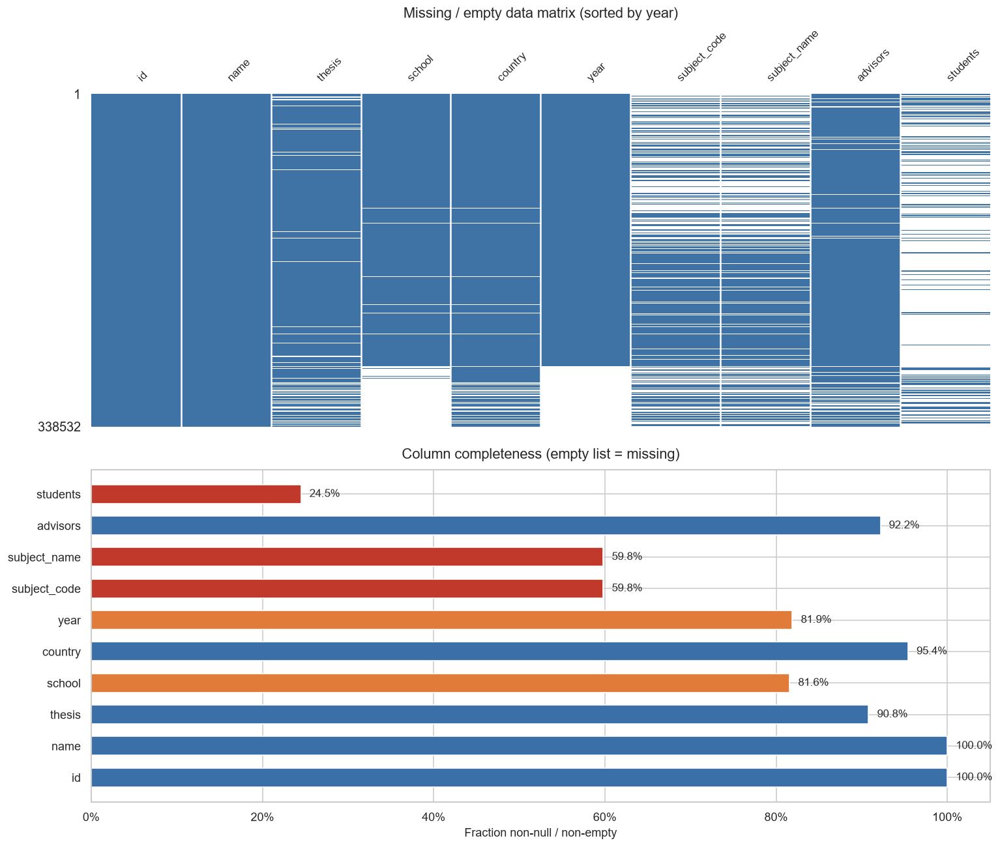

In [74]:
def is_present(val):
    """Returns False for None, NaN, empty string, and empty list."""
    if val is None:
        return False
    if isinstance(val, list):
        return len(val) > 0
    try:
        return pd.notna(val) and str(val).strip() != ""
    except Exception:
        return False

completeness = nodes.apply(lambda col: col.map(is_present).mean()).sort_values()

# columns to display -- prediction columns removed, subject_code is now original data only
col_order = [
    "id", "name", "thesis", "school", "country", "year",
    "subject_code", "subject_name",
    "advisors", "students",
]

nodes_display = nodes[col_order].copy()

# replace empty lists with None so msno sees them as missing
for col in ["advisors", "students"]:
    nodes_display[col] = nodes_display[col].apply(
        lambda x: None if isinstance(x, list) and len(x) == 0 else x
    )

nodes_sorted = nodes_display.sort_values(by="year")

fig, axes = plt.subplots(2, 1, figsize=(13, 11))

# --- missingno matrix ---
plt.sca(axes[0])
msno.matrix(
    nodes_sorted,
    ax=axes[0],
    sparkline=False,
    color=(0.25, 0.45, 0.65),
    fontsize=10,
)
axes[0].set_title("Missing / empty data matrix (sorted by year)", fontsize=13, pad=10)

# --- completeness bars (only for displayed columns, same order) ---
comp_display = completeness.reindex(col_order).dropna()

colors = [
    "#3a6fa8" if v >= 0.9 else "#e07b39" if v >= 0.6 else "#c0392b"
    for v in comp_display.values
]

axes[1].barh(
    range(len(comp_display)),
    comp_display.values,
    color=colors,
    edgecolor="white",
    height=0.6,
)
axes[1].set_yticks(range(len(comp_display)))
axes[1].set_yticklabels(comp_display.index, fontsize=11)
axes[1].set_xlabel("Fraction non-null / non-empty", fontsize=11)
axes[1].set_title("Column completeness (empty list = missing)", fontsize=13, pad=10)
axes[1].xaxis.set_major_formatter(mticker.PercentFormatter(xmax=1))
axes[1].set_xlim(0, 1.05)

for i, v in enumerate(comp_display.values):
    axes[1].text(v + 0.01, i, f"{v:.1%}", va="center", fontsize=10)

plt.tight_layout()
plt.savefig("completeness_panel.png", dpi=150)
plt.show()

## 3. Student Count Distribution

The number of students per mathematician is extremely right-skewed: roughly 75% of
mathematicians have no listed students at all, and only a small fraction have more than
five. The distribution is shown on a log scale to make the tail visible.

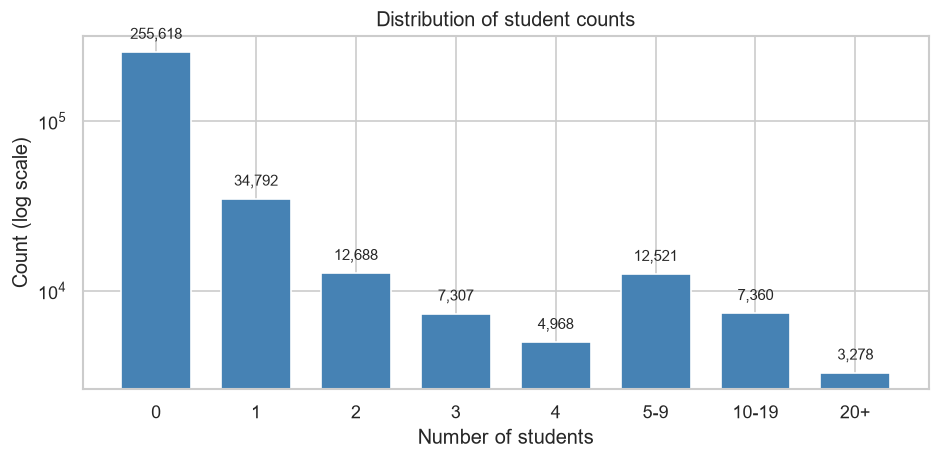

In [75]:
# custom bucketing: 0,1,2,3,4, then 5-9, 10-19, 20+
def bucket(n):
    if n <= 4:
        return str(n)
    elif n < 10:
        return "5-9"
    elif n < 20:
        return "10-19"
    else:
        return "20+"

bucket_order = ["0", "1", "2", "3", "4", "5-9", "10-19", "20+"]

nodes["student_bucket"] = nodes["number_of_students"].apply(bucket)
bucket_counts = nodes["student_bucket"].value_counts().reindex(bucket_order)

fig, ax = plt.subplots(figsize=(8, 4))
ax.bar(
    bucket_order,
    bucket_counts.values,
    color="steelblue",
    edgecolor="white",
    width=0.7,
)
ax.set_yscale("log")
ax.set_xlabel("Number of students")
ax.set_ylabel("Count (log scale)")
ax.set_title("Distribution of student counts")

# annotate each bar with raw count
for i, v in enumerate(bucket_counts.values):
    ax.text(i, v * 1.15, f"{v:,}", ha="center", va="bottom", fontsize=9)

plt.tight_layout()
plt.savefig("student_count_dist.png", dpi=150)
plt.show()

## 4. PhD Output Over Time

### 4.1 All years (1700–2025)
The global histogram shows negligible activity before 1850, a slow rise through
the early 20th century, and an explosive growth phase from the 1950s onward driven
by the post-WWII academic expansion.

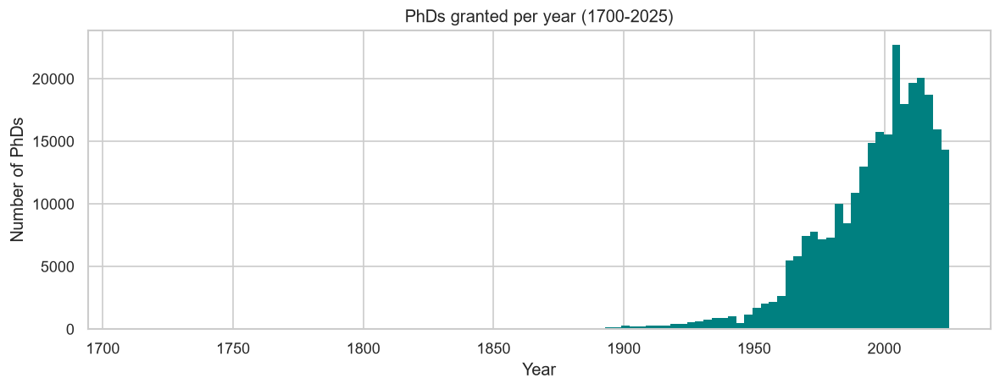

In [76]:
# filter out obvious outliers
year_clean = nodes["year"].dropna()
year_clean = year_clean[(year_clean >= 1700) & (year_clean <= 2025)]

fig, ax = plt.subplots(figsize=(10, 4))
ax.hist(year_clean, bins=100, color="teal", edgecolor="none")
ax.set_xlabel("Year")
ax.set_ylabel("Number of PhDs")
ax.set_title("PhDs granted per year (1700-2025)")
plt.tight_layout()
plt.savefig("phd_year_hist.png")
plt.show()

### 4.2 Modern period (1900–2025)
Zooming in to 1900 onward with 1-year bins reveals finer structure including the
post-Sputnik surge in the 1960s–70s and the apparent drop-off after ~2018, which
is a **data entry lag artifact** rather than a real decline — recent PhDs take
time to be entered into the MGP database.

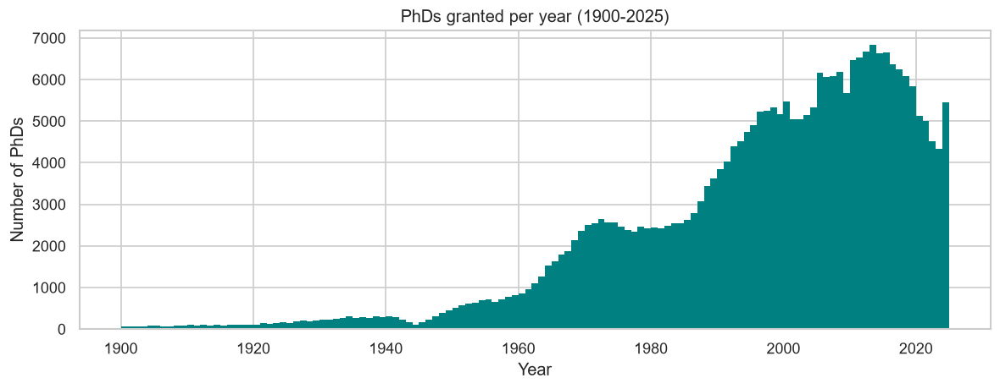

In [77]:
year_modern = year_clean[year_clean >= 1900]

fig, ax = plt.subplots(figsize=(10, 4))
ax.hist(year_modern, bins=range(1900, 2026), color="teal", edgecolor="none")
ax.set_xlabel("Year")
ax.set_ylabel("Number of PhDs")
ax.set_title("PhDs granted per year (1900-2025)")
plt.tight_layout()
plt.show()

## 5. Geography


### 5.1 Top countries by record count
The United States dominates with 138,138 records — more than 3.5x the second-place
country. Germany ranks second with 38,430, followed by the Netherlands (24,055),
United Kingdom (18,269), and France (15,447). Beyond the top 5, counts drop sharply:
Canada has 9,193, Switzerland 8,096, and Russia 5,681.

The Netherlands ranking above the UK and France is surprising given its population size.
This reflects **MGP coverage depth rather than actual PhD output** — Dutch universities
have submitted records more systematically. This is confirmed by the school breakdown:
the Netherlands' 24,055 records come almost entirely from 15 identifiable institutions,
with Universiteit van Amsterdam alone accounting for 4,840. Germany's 38,430 records,
by contrast, are spread across hundreds of institutions with the largest (Göttingen)
contributing only 629 — suggesting many German records are simply not in the database.



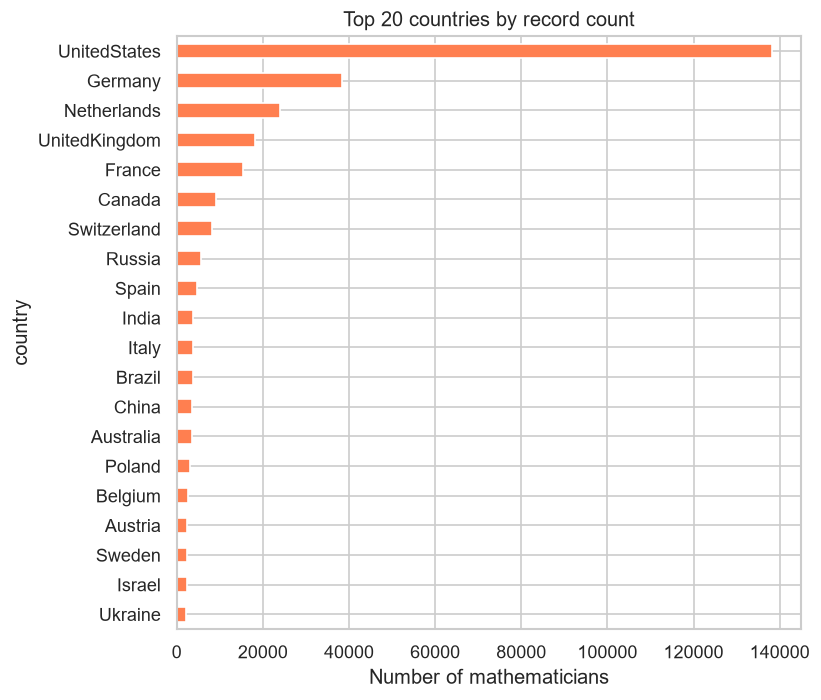

In [78]:
top_countries = (
    nodes["country"].dropna()
    .value_counts()
    .head(20)
    .sort_values()
)

fig, ax = plt.subplots(figsize=(7, 6))
top_countries.plot.barh(ax=ax, color="coral")
ax.set_xlabel("Number of mathematicians")
ax.set_title("Top 20 countries by record count")
plt.tight_layout()
plt.savefig("top_countries.png")
plt.show()

In [79]:
print(nodes["country"].dropna().value_counts().head(10))
 

country
UnitedStates     138138
Germany           38430
Netherlands       24055
UnitedKingdom     18269
France            15447
Canada             9193
Switzerland        8096
Russia             5681
Spain              4758
India              3826
Name: count, dtype: int64



### 5.2 PhD output over time: top 5 countries
The US line rises steeply from the 1950s, peaking at roughly 3,200 PhDs per year
around 2005 before declining. The other four countries (Germany, Netherlands, UK,
France) each plateau in the 200–500 range and remain far below the US throughout.
All countries show a sharp drop after 2020, which is probably a **data entry lag artifact**
not a real decline.


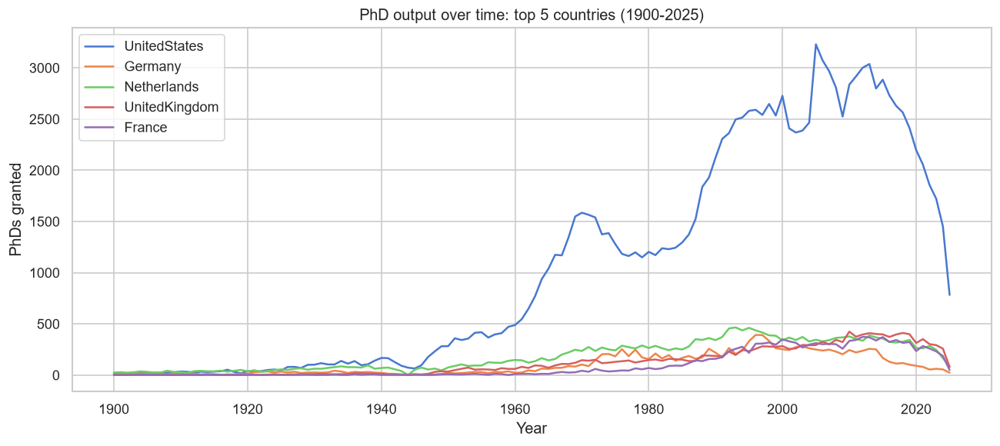

In [80]:
top5 = nodes["country"].value_counts().head(5).index.tolist()
subset = nodes[nodes["country"].isin(top5) & nodes["year"].notna()].copy()
subset = subset[(subset["year"] >= 1900) & (subset["year"] <= 2025)]

by_year_country = (
    subset.groupby(["year", "country"])
    .size()
    .reset_index(name="count")
)

fig, ax = plt.subplots(figsize=(11, 5))
for country in top5:
    d = by_year_country[by_year_country["country"] == country]
    ax.plot(d["year"], d["count"], label=country, linewidth=1.5)

ax.set_xlabel("Year")
ax.set_ylabel("PhDs granted")
ax.set_title("PhD output over time: top 5 countries (1900-2025)")
ax.legend()
plt.tight_layout()
plt.savefig("phds_over_time_by_country.png")
plt.show()

### 5.3 Top countries per century
The century panels show a clear historical shift in where mathematics was institutionally
centered. The Netherlands leads in the 1501–1600 and 1601–1700 panels (though with
very small counts of 2 and 25 respectively). Germany takes over in 1701–1800 (12
records) and dominates 1801–1900 with 361 records, ahead of the Netherlands (334)
and a distant United States (210). By 1901–2000 the US has surged to 69,360 records
against the Netherlands' 14,797 and Germany's 8,076. The 2001–2100 panel (covering
only 2001–2025) shows the US still leading at 64,827, with UK (8,541), Netherlands
(8,284), and France (7,703) clustered closely behind.

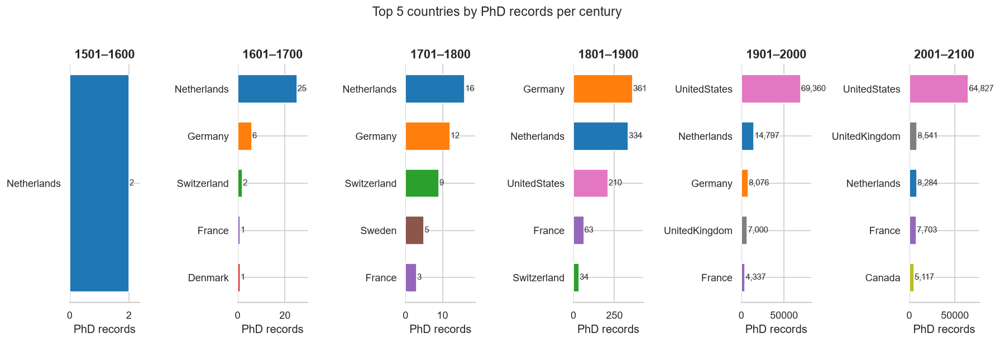

In [81]:
# bin years into centuries
def to_century(year):
    if pd.isna(year):
        return None
    c = int(year) // 100 + 1
    return f"{c*100 - 99}–{c*100}"  # e.g. "1901–2000"

nodes["century"] = nodes["year"].apply(to_century)

# only keep centuries with enough data and valid countries
valid = nodes[nodes["century"].notna() & nodes["country"].notna()].copy()

# count records per (century, country)
century_country = (
    valid.groupby(["century", "country"])
    .size()
    .reset_index(name="count")
)

# for each century, keep top 5 countries
top_per_century = (
    century_country
    .sort_values(["century", "count"], ascending=[True, False])
    .groupby("century")
    .head(5)
)

# only plot centuries with meaningful data (drop pre-1800 noise)
centuries_to_plot = ["1501–1600","1601–1700","1701–1800", "1801–1900", "1901–2000", "2001–2100"]
plot_data = top_per_century[top_per_century["century"].isin(centuries_to_plot)]

# assign a consistent color per country across panels
all_countries = plot_data["country"].unique()
palette = sns.color_palette("tab10", len(all_countries))
color_map = dict(zip(all_countries, palette))

fig, axes = plt.subplots(1, len(centuries_to_plot), figsize=(15, 5), sharey=False)

for ax, century in zip(axes, centuries_to_plot):
    data = (
        plot_data[plot_data["century"] == century]
        .sort_values("count")
    )
    bars = ax.barh(
        data["country"],
        data["count"],
        color=[color_map[c] for c in data["country"]],
        edgecolor="white",
        height=0.6,
    )
    # annotate
    for bar, val in zip(bars, data["count"]):
        ax.text(bar.get_width() + data["count"].max() * 0.01, bar.get_y() + bar.get_height() / 2,
                f"{val:,}", va="center", fontsize=9)

    ax.set_title(century, fontsize=13, fontweight="bold")
    ax.set_xlabel("PhD records")
    ax.set_xlim(0, data["count"].max() * 1.18)
    sns.despine(ax=ax, left=True)
    ax.tick_params(left=False)

fig.suptitle("Top 5 countries by PhD records per century", fontsize=14, y=1.02)
plt.tight_layout()
plt.savefig("countries_by_century.png", dpi=150, bbox_inches="tight")
plt.show()

## 6. Institutions

The top 20 schools are dominated by large US research universities, with MIT leading
at roughly 6,200 records, followed closely by UC Berkeley (~6,050) and Stanford
(~4,600). Harvard, Michigan, Wisconsin-Madison, Illinois, and UCLA all appear in the
4,000–3,800 range.

Four Dutch institutions appear in the top 20: Universiteit van Amsterdam (~4,840),
Rijksuniversiteit Groningen (~3,225), Technische Universiteit Delft (~3,114), and
Technische Universiteit Eindhoven (~2,965). Their presence this high reflects the
same systematic record submission from Dutch universities noted in Section 5 — it
does not mean these schools produced more math PhDs than, say, Oxford or Cambridge,
both of which appear lower in the ranking.

University of Cambridge is the only non-US, non-Dutch institution in the top 20,
reflecting the generally sparse MGP coverage of European universities outside the
Netherlands.

Note: one record with a blank school name (empty string rather than null) was
identified and excluded from this chart.

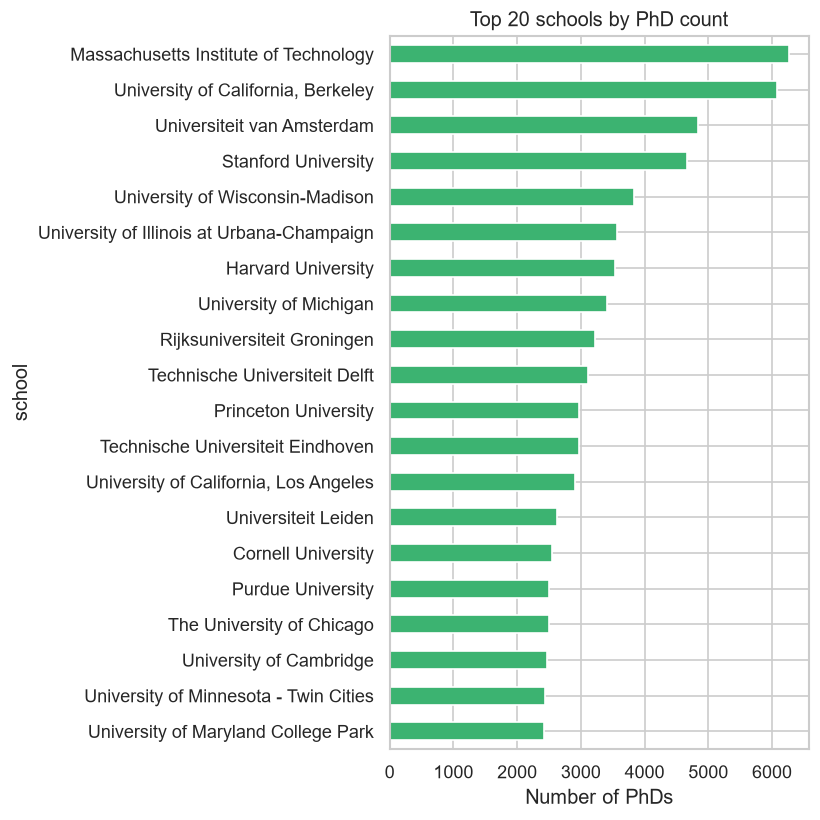

In [82]:
top_schools = (
    nodes["school"]
    .dropna()
    .replace("", pd.NA)   # catch empty strings
    .dropna()
    .str.strip()           # catch whitespace-only entries
    .replace("", pd.NA)
    .dropna()
    .value_counts()
    .head(20)
    .sort_values()
)
fig, ax = plt.subplots(figsize=(7, 7))
top_schools.plot.barh(ax=ax, color="mediumseagreen")
ax.set_xlabel("Number of PhDs")
ax.set_title("Top 20 schools by PhD count")
plt.tight_layout()
plt.savefig("top_schools.png")
plt.show()

## 7. Subject Areas (MSC Classification)


### 7.1 Top 20 MSC Subject Codes Overall

Computer science (68) is the single largest subject with ~35,000 records, nearly
double the second-place game theory and economics (91) at ~20,000, and statistics
(62) at ~18,000. After the top 3 there is a sharp drop: numerical analysis (65),
probability theory (60), and PDE (35) each sit around 7,000–8,000. The remaining
14 subjects in the top 20 are tightly clustered between 3,000 and 6,000 records,
including number theory (11), combinatorics (05), fluid mechanics (76), quantum
theory (81), and algebraic geometry (14).

Note that only 59.8% of records have a subject code, so these counts represent the
coded subset of 202,492 records rather than the full 338,526.

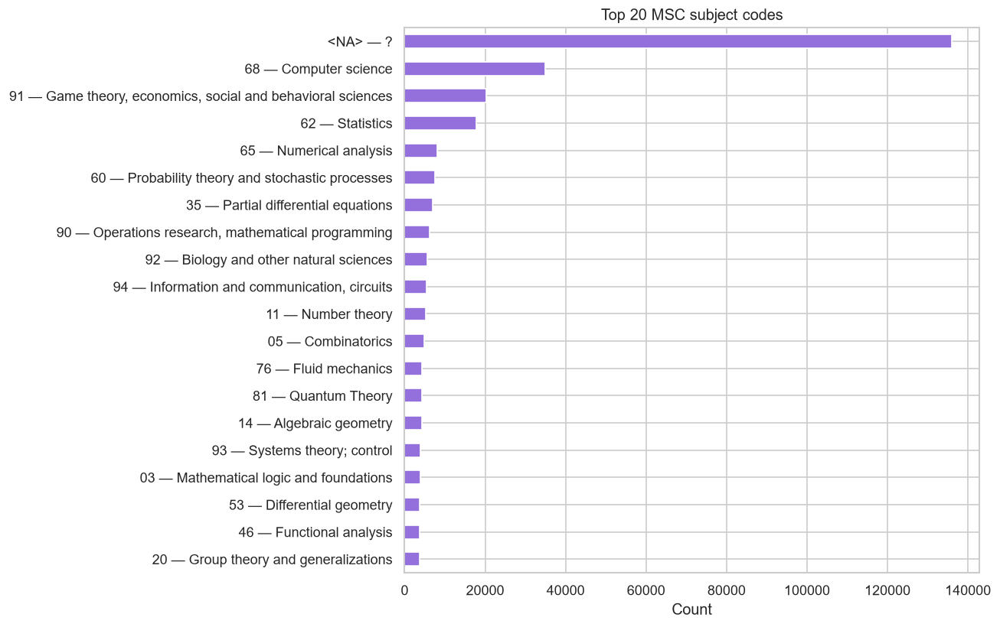

In [83]:
# subject_code is Int64, convert to string for labels
nodes["subject_code_str"] = nodes["subject_code"].astype(str).str.zfill(2)

# most common name per code (safety measure in case of minor label inconsistencies)
code_to_name = (
    nodes.dropna(subset=["subject_code", "subject_name"])
    .groupby("subject_code_str")["subject_name"]
    .agg(lambda x: x.mode()[0])
)

top_codes = nodes["subject_code_str"].dropna().value_counts().head(20)

top_codes.index = [
    f"{code} — {code_to_name.get(code, '?')}" for code in top_codes.index
]
top_codes = top_codes.sort_values()

fig, ax = plt.subplots(figsize=(11, 7))
top_codes.plot.barh(ax=ax, color="mediumpurple")
ax.set_xlabel("Count")
ax.set_title("Top 20 MSC subject codes")
plt.tight_layout()
plt.savefig("top_subjects.png", dpi=150)
plt.show()

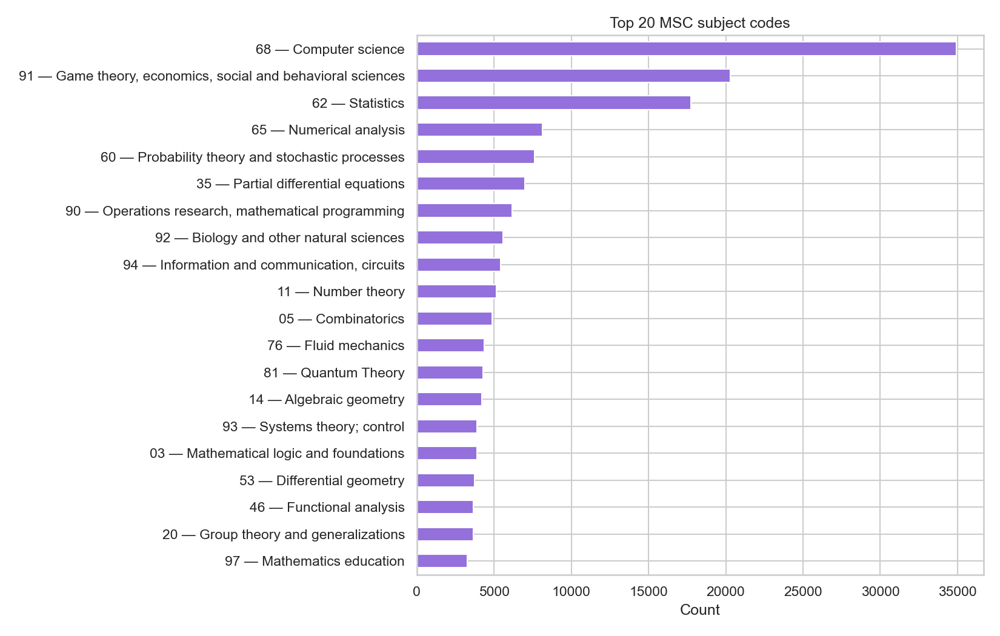

### 7.2 Dominant Subjects per Historical Period

The subject mix shifts substantially across periods, though early periods have very
sparse coverage and should be interpreted cautiously:

- **1700–1799 (n=15)**: Biology and natural sciences (92) leads with 6 records,
  followed by General (00) with 3. Counts are too small to draw conclusions.
- **1800–1849 (n=27)**: Astronomy and astrophysics (85) leads with 8 records.
  Still very sparse.
- **1850–1899 (n=231)**: Game theory and economics (91) appears at the top with
  39 records, followed by optics (78) with 31 and astronomy (85) with 24. The
  presence of 91 this early likely reflects historical economics dissertations
  being retroactively coded.
- **1900–1949 (n=2,382)**: Game theory and economics (91) dominates with 581
  records, followed by biology (92) at 176, optics (78) at 140, quantum theory
  (81) at 128, and astronomy (85) at 115. Pure math fields are largely absent,
  suggesting subject coding in this era skews toward applied and interdisciplinary work.
- **1950–1999 (n=51,110)**: The landscape modernizes sharply. Game theory (91)
  still leads at 8,896, but computer science (68) enters at 6,598 and statistics
  (62) at 4,143. Quantum theory (81) holds at 1,769 and probability (60) at 1,698.
- **2000–2025 (n=113,982)**: Computer science (68) takes the top spot decisively
  with 20,294 records, followed by statistics (62) at 11,820 and game theory (91)
  at 8,945. Numerical analysis (65) and probability (60) round out the top 5 at
  5,136 and 4,744 respectively.

Records per period:
period
Before 1850        44
1850–1899         231
1900–1949        2382
1950–1999       51110
2000–2025      113982
Name: count, dtype: int64


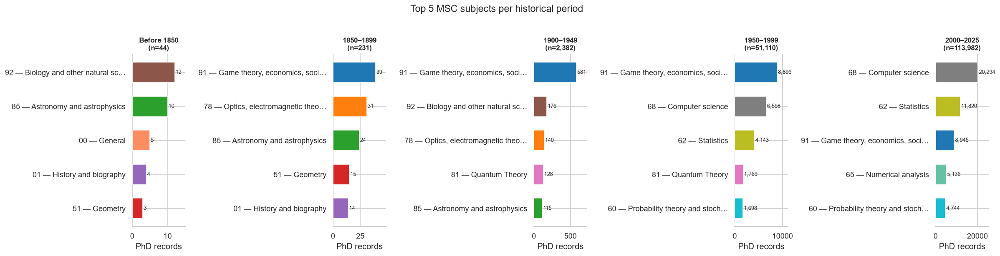

In [84]:
def to_period(year):
    if pd.isna(year):
        return None
    y = int(year)
    if y < 1850:
        return "Before 1850"
    elif y < 1900:
        return "1850–1899"
    elif y < 1950:
        return "1900–1949"
    elif y < 2000:
        return "1950–1999"
    else:
        return "2000–2025"

nodes["period"] = nodes["year"].apply(to_period)

# normalize subject_code to zero-padded string once
nodes["subject_code_str"] = nodes["subject_code"].astype(str).str.zfill(2)

period_order = ["Before 1850", "1850–1899", "1900–1949", "1950–1999", "2000–2025"]

valid = nodes[
    nodes["period"].notna()
    & nodes["subject_code_str"].notna()
    & (nodes["subject_code_str"] != "<NA>")
    & nodes["subject_name"].notna()
].copy()

period_subject = (
    valid.groupby(["period", "subject_code_str", "subject_name"])
    .size()
    .reset_index(name="count")
)

top_per_period = (
    period_subject
    .sort_values(["period", "count"], ascending=[True, False])
    .groupby("period")
    .head(5)
)

period_totals = valid["period"].value_counts()
valid_periods = period_totals[period_totals >= 10].index
top_per_period = top_per_period[top_per_period["period"].isin(valid_periods)]
periods_to_plot = [p for p in period_order if p in valid_periods]

print("Records per period:")
print(period_totals.reindex(period_order).dropna().astype(int))

n = len(periods_to_plot)
fig, axes = plt.subplots(1, n, figsize=(4 * n, 5), sharey=False)
if n == 1:
    axes = [axes]  # ensure iterable

all_subjects = top_per_period["subject_code_str"].unique()
palette = sns.color_palette("tab10", min(len(all_subjects), 10))
extra = sns.color_palette("Set2", max(0, len(all_subjects) - 10))
color_map = dict(zip(all_subjects, palette + extra))

for ax, period in zip(axes, periods_to_plot):
    data = (
        top_per_period[top_per_period["period"] == period]
        .sort_values("count")
    )
    labels = [
        f"{row.subject_code_str} — {row.subject_name[:28]}{'…' if len(row.subject_name) > 28 else ''}"
        for row in data.itertuples()
    ]
    bars = ax.barh(
        labels,
        data["count"].values,
        color=[color_map[c] for c in data["subject_code_str"]],
        edgecolor="white",
        height=0.6,
    )
    max_count = data["count"].max()
    for bar, val in zip(bars, data["count"].values):
        ax.text(
            bar.get_width() + max_count * 0.02,
            bar.get_y() + bar.get_height() / 2,
            f"{val:,}", va="center", fontsize=8,
        )
    total = period_totals[period]
    ax.set_title(f"{period}\n(n={total:,})", fontsize=10, fontweight="bold")
    ax.set_xlabel("PhD records")
    ax.set_xlim(0, max_count * 1.25)
    sns.despine(ax=ax, left=True)
    ax.tick_params(left=False)

fig.suptitle("Top 5 MSC subjects per historical period", fontsize=14, y=1.02)
plt.tight_layout()
plt.savefig("subjects_by_period.png", dpi=150, bbox_inches="tight")
plt.show()

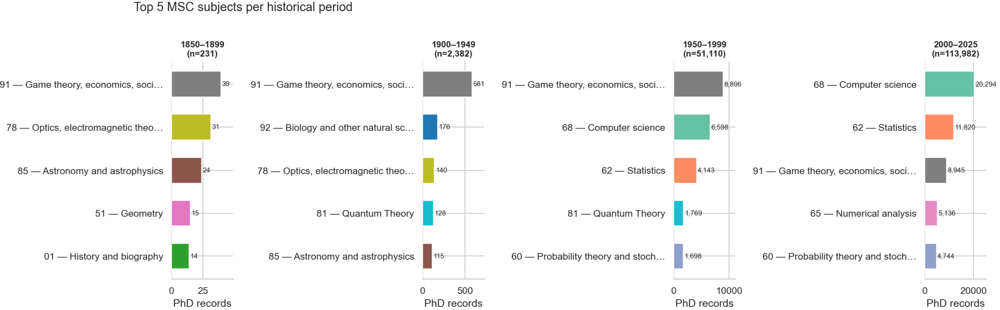

### 7.3 Subject Trends Over Time (1900–2023)

The 5-year rolling average reveals three distinct phases:

**Pre-1960**: All subjects produce fewer than 50 PhDs per year. Game theory and
economics (91, orange) is the early leader, rising steadily from 1900 onward and
reaching ~175 by 1960. Everything else is essentially flat near zero.

**1960–1995**: CS (68, blue) begins its climb from near zero, crossing 100 around
1980 and accelerating through the 1990s. Statistics (62, green) and fluid mechanics
(76, orange-brown) also grow steadily. The remaining fields begin separating from
the baseline, with most reaching 50–100 PhDs per year by 1995.

**1995–2023**: CS surges to a peak of roughly 1,050 PhDs per year around 2008–2010
before declining sharply — partly a real trend as CS work moved into engineering
and interdisciplinary programs, and partly the data lag effect near 2023. Statistics
(62) peaks around 2020 at ~600. Game theory (91) peaks around 2018 at ~480. All
other subjects plateau in the 150–250 range. The sharp universal drop after 2020
is the same data entry lag artifact seen in the year histogram.

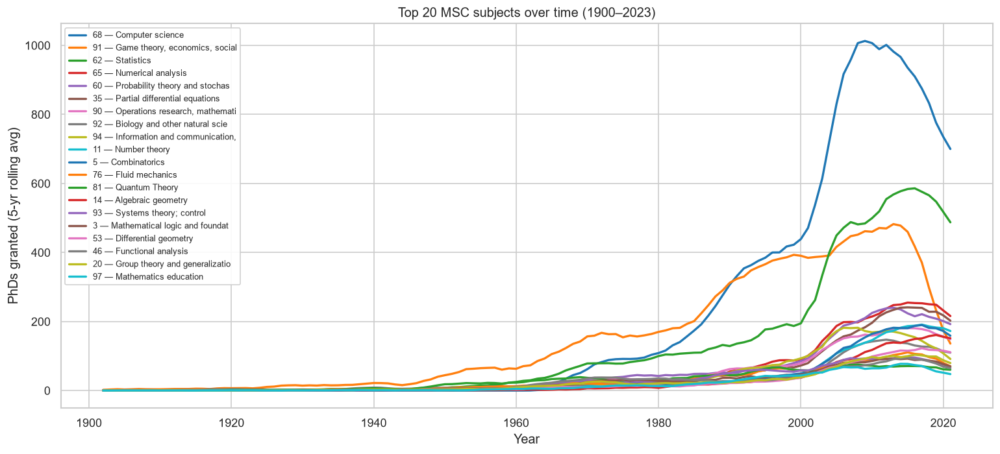

In [85]:
# pick top N subjects by total count to keep the plot readable
top_n = 20

top_subject_codes = (
    nodes["subject_code"].dropna()
    .value_counts()
    .head(top_n)
    .index.tolist()
)

# filter to valid rows
valid = nodes[
    nodes["subject_code"].isin(top_subject_codes) &
    nodes["year"].notna()
].copy()
valid = valid[(valid["year"] >= 1900) & (valid["year"] <= 2023)]

# build short readable labels
code_to_label = (
    valid.dropna(subset=["subject_code", "subject_name"])
    .groupby("subject_code")["subject_name"]
    .agg(lambda x: x.mode()[0])
    .str.slice(0, 30)  # truncate long names
)

by_year_subject = (
    valid.groupby(["year", "subject_code"])
    .size()
    .reset_index(name="count")
)

# 5-year rolling average per subject
fig, ax = plt.subplots(figsize=(13, 6))

palette = sns.color_palette("tab10", top_n)

for i, code in enumerate(top_subject_codes):
    d = (
        by_year_subject[by_year_subject["subject_code"] == code]
        .set_index("year")["count"]
        .reindex(range(1900, 2024), fill_value=0)
        .rolling(5, center=True)
        .mean()
    )
    label = f"{code} — {code_to_label.get(code, '?')}"
    ax.plot(d.index, d.values, label=label, linewidth=2, color=palette[i])

ax.set_xlabel("Year")
ax.set_yscale("linear")
ax.set_xscale("linear")
ax.set_ylabel("PhDs granted (5-yr rolling avg)")
ax.set_title(f"Top {top_n} MSC subjects over time (1900–2023)")
ax.legend(loc="upper left", fontsize=8, framealpha=0.9)
plt.tight_layout()
plt.savefig("subjects_over_time.png", dpi=150)
plt.show()

## 8. Subject Specialization by Country

We compute a lift score for each (country, subject) pair:

$$\text{lift} = \frac{\text{share of subject within country}}{\text{share of subject globally}}$$

A lift of 2.0x means a country produces twice the global proportion of PhDs in that
subject. Only subjects with at least 30 records per country are included to avoid
small-sample distortions. The dashed line marks lift = 1.0 (global average).

### Key findings by country

**United States (lift scores 1.22x–1.52x, modest specialization)**
The US shows the most uniform distribution of any country — no subject exceeds 1.52x.
Its strongest specializations are game theory and economics (91) at 1.52x, manifolds
and cell complexes (57) at 1.30x, and statistics (62) at 1.30x. The low lift scores
overall reflect the US producing PhDs broadly across all fields rather than
concentrating in any one tradition.

**Germany (lift scores 2.15x–2.99x)**
Germany's top specialization is history and biography of mathematics (01) at 2.99x,
followed by geometry (51) at 2.77x and real functions (26) at 2.37x. Mechanics of
particles (70) and field theory (12) also feature. This pattern is consistent with
Germany's classical 19th-century mathematical tradition in geometry and analysis,
and its strong historical scholarship.

**Netherlands (lift scores 2.31x–4.53x, physics-adjacent math)**
The Netherlands shows strong concentration in astronomy and astrophysics (85) at
4.53x and classical thermodynamics (80) at 4.35x, with statistical mechanics (82)
at 3.28x and quantum theory (81) at 2.67x. This is a clear physics-mathematics
interface signature, likely driven by the strong Dutch tradition in theoretical
physics (Lorentz, Ehrenfest, van der Waals) feeding into applied math PhDs.

**United Kingdom (lift scores 1.91x–3.61x, pure math and mathematical physics)**
The UK is most concentrated in group theory and generalizations (20) at 3.61x and
relativity and gravitational theory (83) at 3.60x — reflecting both a strong pure
algebra tradition and the British school of mathematical physics (Penrose, Hawking
and their descendants). Category theory (18) at 2.51x and measure and integration
(28) at 2.18x reinforce the pure mathematics orientation.

**France (lift scores 2.22x–2.88x, analysis and geometry)**
France's specializations read almost like a Bourbaki syllabus: PDE (35) at 2.88x,
several complex variables (32) at 2.87x, calculus of variations (49) at 2.63x,
global analysis on manifolds (58) at 2.58x, and field theory and polynomials (12)
at 2.42x. Probability theory (60) at 2.22x rounds out the list. This is one of the
most coherent national signatures in the dataset — a tightly defined tradition in
hard analysis and modern geometry.

**Canada (lift scores 1.59x–2.78x, discrete and algebraic math)**
Canada's top subject is combinatorics (05) at 2.78x, followed by linear and
multilinear algebra (15) at 2.07x and convex and discrete geometry (52) at 1.80x.
Operator theory (47) and category theory (18) also appear. This reflects a strong
Canadian school in discrete mathematics and algebraic structures, consistent with
the influence of institutions like Waterloo and Montreal.

**Switzerland (lift scores 1.43x–5.73x, natural sciences and geometry)**
Switzerland shows the widest spread of any country. Biology and natural sciences (92)
leads at 5.73x and geophysics (86) at 4.62x, suggesting many Swiss math PhDs sit at
the interface with natural sciences — consistent with the ETH Zurich tradition of
applied and interdisciplinary mathematics. Astronomy (85) at 2.51x follows, with
numerical analysis (65) and geometry (51) rounding out the list.

**Russia (lift scores 7.59x–12.62x, classical analysis)**
Russia has by far the strongest and most concentrated national signature in the
dataset. Ordinary differential equations (34) leads at 12.62x, followed by
functional analysis (46) at 10.31x, real functions (26) at 8.74x, general algebraic
systems (08) at 7.96x, functions of a complex variable (30) at 7.93x, and general
topology (54) at 7.59x. These lift scores are an order of magnitude higher than
most other countries. This is the direct fingerprint of the Soviet mathematical
school, which systematically prioritized classical hard analysis, topology, and
algebra from the 1930s through the 1980s.

### The CS exception
Computer science (68) does not appear in any country's top specializations. A direct
check confirms its lift is close to 1.0 across all eight countries. CS is a globally
distributed field with no geographic concentration, consistent with its emergence as
a universal applied discipline rather than one rooted in any particular national
mathematical tradition.

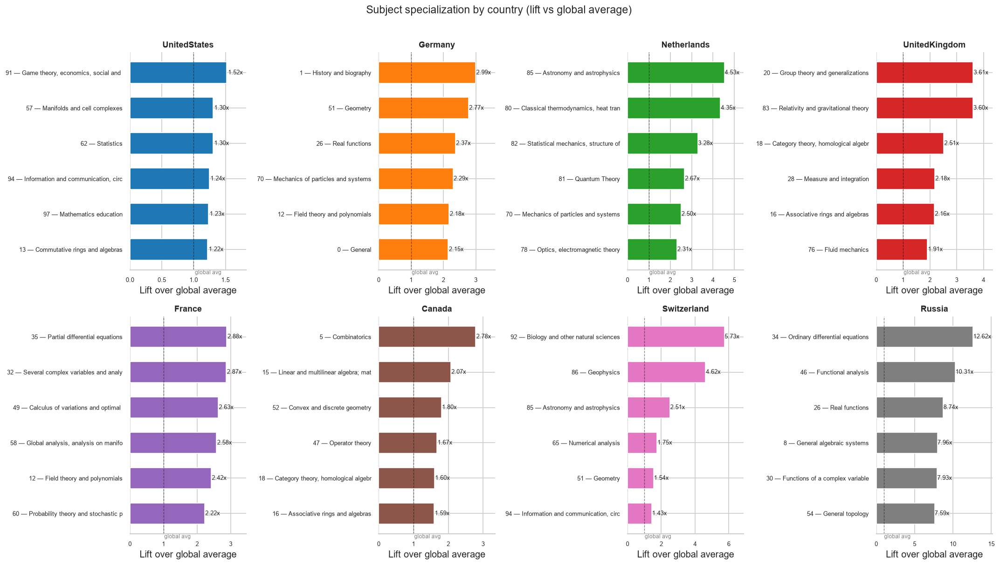

In [86]:
# lift = (share of subject within country) / (share of subject globally)
# lift > 1 means the country is overrepresented in that subject

top_countries = nodes["country"].value_counts().head(8).index.tolist()

valid = nodes[
    nodes["country"].isin(top_countries) &
    nodes["subject_code"].notna() &
    nodes["subject_name"].notna()
].copy()

# global subject shares
global_shares = valid["subject_code"].value_counts(normalize=True)

# compute lift per country x subject
records = []
for country in top_countries:
    country_data = valid[valid["country"] == country]
    country_shares = country_data["subject_code"].value_counts(normalize=True)
    for code, country_share in country_shares.items():
        global_share = global_shares.get(code, 0)
        if global_share > 0:
            lift = country_share / global_share
            name = (
                valid[valid["subject_code"] == code]["subject_name"]
                .mode()[0][:35]
            )
            records.append({
                "country": country,
                "subject_code": code,
                "subject_name": name,
                "lift": lift,
                "count": country_data["subject_code"].eq(code).sum(),
            })

lift_df = pd.DataFrame(records)

# for each country keep top 6 by lift, but require at least 30 records
# to avoid obscure subjects inflating lift on tiny counts
top_lift = (
    lift_df[lift_df["count"] >= 30]
    .sort_values("lift", ascending=False)
    .groupby("country")
    .head(6)
)

# plot
n_countries = len(top_countries)
fig, axes = plt.subplots(2, 4, figsize=(18, 10), sharey=False)
axes = axes.flatten()

country_palette = sns.color_palette("tab10", n_countries)

for i, country in enumerate(top_countries):
    ax = axes[i]
    data = (
        top_lift[top_lift["country"] == country]
        .sort_values("lift")
    )
    label = [
        f"{row.subject_code} — {row.subject_name}"
        for row in data.itertuples()
    ]
    bars = ax.barh(
        label,
        data["lift"].values,
        color=country_palette[i],
        edgecolor="white",
        height=0.6,
    )
    # reference line at lift=1 (global average)
    ax.axvline(1, color="black", linewidth=0.8, linestyle="--", alpha=0.5)
    ax.text(1.02, -0.7, "global avg", fontsize=7, color="gray")

    for bar, val in zip(bars, data["lift"].values):
        ax.text(
            bar.get_width() + 0.02,
            bar.get_y() + bar.get_height() / 2,
            f"{val:.2f}x",
            va="center", fontsize=8,
        )

    ax.set_title(country, fontsize=11, fontweight="bold")
    ax.set_xlabel("Lift over global average")
    ax.set_xlim(0, data["lift"].max() * 1.2)
    sns.despine(ax=ax, left=True)
    ax.tick_params(left=False, labelsize=8)

fig.suptitle("Subject specialization by country (lift vs global average)", fontsize=14, y=1.01)
plt.tight_layout()
plt.savefig("subject_lift_by_country.png", dpi=150, bbox_inches="tight")
plt.show()

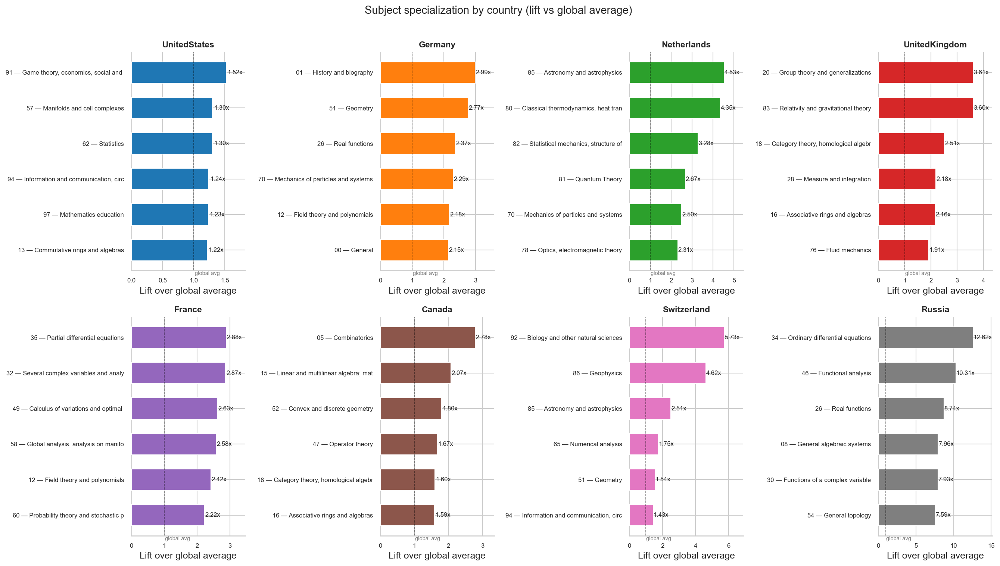

In [87]:
cs_lift = lift_df[lift_df["subject_code"] == "68"][["country", "lift", "count"]].sort_values("lift", ascending=False)
print(cs_lift.to_string(index=False))

Empty DataFrame
Columns: [country, lift, count]
Index: []


## 9. Thesis Title Analysis

In [88]:
nodes["thesis"].dropna().head(10).tolist()

['Statics of Special Types of Homogeneous Elastic Slabs with Variable Thickness',
 'The Approximate Solution of Linear Differential Equations by the Use of Functionals',
 'Statical Equilibrium of Skew and Sector-Shaped Plates',
 'Stresses in Moderately Thick Rectangular Plates',
 'Finite Strain Analysis in Elastic Theory',
 'Solutions of Clamped Plated Problems by Means of Functions Derived from Membrane Characteristic Functions',
 'Explicit Solutions of Certain Singular Integral Equations',
 'Flow of Viscous Fluid between Slowing Rotating, Eccentric Cylinders',
 'Properties of Kernels of Integral Equations Whose Iterates Satisfy Linear Relations',
 'Analytical Study of Dynamic Loads on Elastically Supported Slabs']

### 9.1 Global Word Cloud

The global word cloud across all 307,399 thesis titles with recorded titles reveals
the dominant vocabulary of mathematical research. The largest words — "System",
"Dynamic", "Model", "Analysis", "Structure" — reflect the broad applied orientation
of the dataset, which skews heavily toward post-1950 PhDs when applied fields
overtook classical pure mathematics in volume.

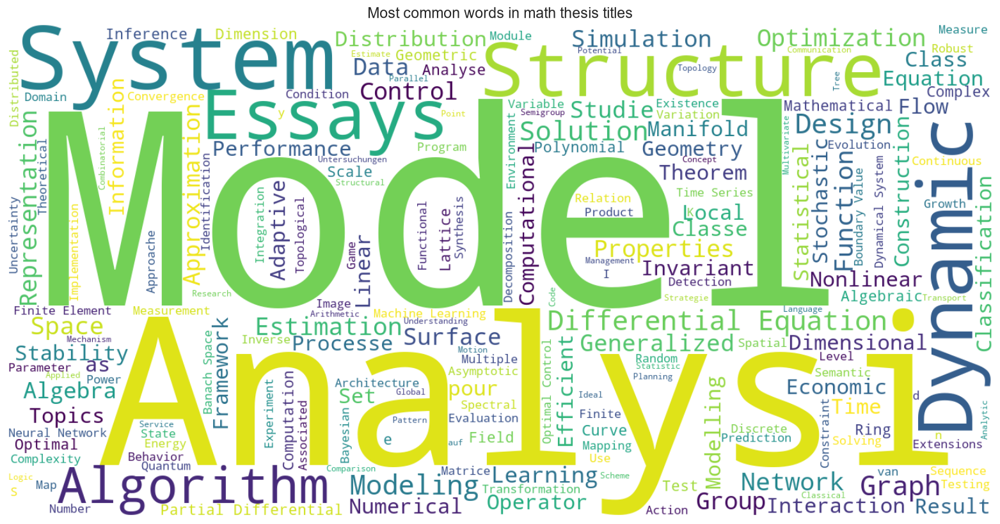

In [89]:
from wordcloud import WordCloud

text = " ".join(nodes["thesis"].dropna().tolist())

wc = WordCloud(
    width=1400, height=700,
    background_color="white",
    colormap="viridis",
    stopwords={# generic english
    "the", "a", "an", "of", "in", "and", "for", "on", "with", "to", "by",
    "from", "at", "is", "its", "their", "some", "using", "based", "via",
    "under", "through", "non", "two", "three", "multi", "large", "high",
    "new", "real", "general", "various", "certain", "related", "over",
    "between", "within", "about", "toward", "towards", "case", "cases",
    "role", "type", "types", "effect", "effects", "impact", "aspect",
    "aspects", "topic", "essay", "study", "thesis", "problem", "problems",
    # french
    "de", "la", "le", "les", "sur", "du", "des", "en", "et", "une", "un",
    "par", "au", "aux", "dans", "avec", "à",
    # german
    "und", "der", "die", "das", "ein", "eine", "über", "uber", "zur",
    "zum", "bei", "im", "zu", "mit", "von", "für", "fur", "als",
    # structural filler
    "approach", "method", "methods", "technique", "techniques",
    "contribution", "contributions", "introduction", "investigation",
    "development", "extension", "generalization", "characterization",
    "application", "applications", "theory","theorie", "theories",},
    max_words=200,
).generate(text)

fig, ax = plt.subplots(figsize=(14, 7))
ax.imshow(wc, interpolation="bilinear")
ax.axis("off")
ax.set_title("Most common words in math thesis titles", fontsize=14)
plt.tight_layout()
plt.savefig("thesis_wordcloud.png", dpi=150)
plt.show()

### 9.2 Word Clouds by Top 3 MSC Subjects

Three iterations of the subject-level word clouds were produced, progressively
removing cross-domain and generic academic vocabulary to surface the most
field-distinctive terminology. The final version (Image 4) with the most aggressive
stopword filtering gives the clearest signal.

**68 — Computer Science**
The final cloud is dominated by "Algorithm", "Software", "Language", "Machine",
"Graph", "Distributed", "Optimization", and "Processing". The presence of "Machine"
and "Language" reflects the growth of machine learning and natural language
processing as dominant subfields within CS PhDs. "Distributed", "Parallel", and
"Wireless" point to systems and networking research. "Verification" and "Security"
appear as smaller but consistent themes.

**91 — Game Theory, Economics, Social and Behavioral Sciences**
The economics cloud centers on "Economic", "Market", "Labor", "Financial",
"International", "Policy", and "Growth". "Macroeconomic", "Equilibrium", "Trade",
and "Political" are prominent in the mid-tier. This vocabulary is clearly
distinguishable from the other two fields, with almost no overlap in the top terms —
confirming that thesis language alone carries strong signal for this MSC code.

**62 — Statistics**
The statistics cloud shows "Regression", "Bayesian", "Statistical", "Multivariate",
"Nonparametric", "Longitudinal", "Survival", and "Likelihood" as the dominant terms.
"Dimensional", "Stochastic", "Linear", and "Variable" are also prominent. The
presence of "Clinical", "Disease", "Gene", and "Survival" reflects the heavy
overlap between statistics PhDs and biostatistics applications.

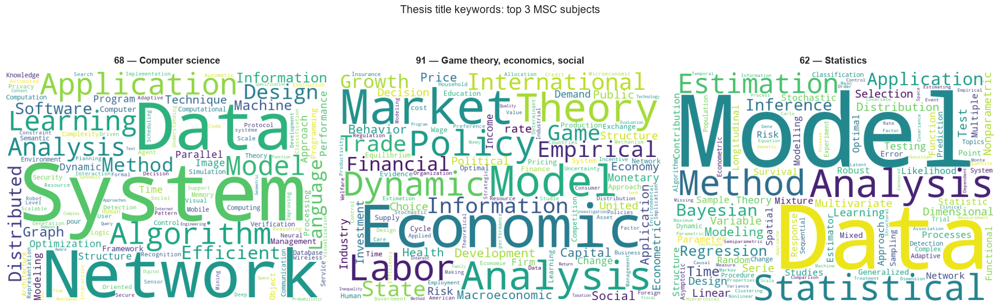

In [90]:
from wordcloud import WordCloud

custom_stopwords = {
    # generic english
    "the", "a", "an", "of", "in", "and", "for", "on", "with", "to", "by",
    "from", "at", "is", "its", "their", "some", "using", "based", "via",
    "under", "through", "non", "two", "three", "multi", "large", "high",
    "new", "real", "general", "various", "certain", "related", "over",
    "between", "within", "about", "toward", "towards", "case", "cases",
    "role", "type", "types", "effect", "effects", "impact", "aspect",
    "aspects", "topic", "essay","essays", "study", "thesis", "problem", "problems",
    # french
    "de", "la", "le", "les", "sur", "du", "des", "en", "et", "une", "un",
    "par", "au", "aux", "dans", "avec", "à",
    # german
    "und", "der", "die", "das", "ein", "eine", "über", "uber", "zur",
    "zum", "bei", "im", "zu", "mit", "von", "für", "fur", "als",
}

top3_codes = (
    nodes["subject_code"].dropna()
    .value_counts()
    .head(3)
    .index.tolist()
)

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

for ax, code in zip(axes, top3_codes):
    mask = nodes["subject_code"] == code
    text = " ".join(nodes.loc[mask, "thesis"].dropna().tolist())
    name = code_to_label.get(code, code)

    wc = WordCloud(
        width=700, height=500,
        background_color="white",
        colormap="viridis",
        stopwords=custom_stopwords,
        max_words=120,
        collocations=False,   # avoids repeating bigrams
        min_word_length=4,    # cuts "van", "Two", "Non" etc.
    ).generate(text)

    ax.imshow(wc, interpolation="bilinear")
    ax.axis("off")
    ax.set_title(f"{code} — {name}", fontsize=12, fontweight="bold", pad=10)

fig.suptitle("Thesis title keywords: top 3 MSC subjects", fontsize=14, y=1.01)
plt.tight_layout()
plt.savefig("thesis_wordcloud_top3.png", dpi=150, bbox_inches="tight")
plt.show()

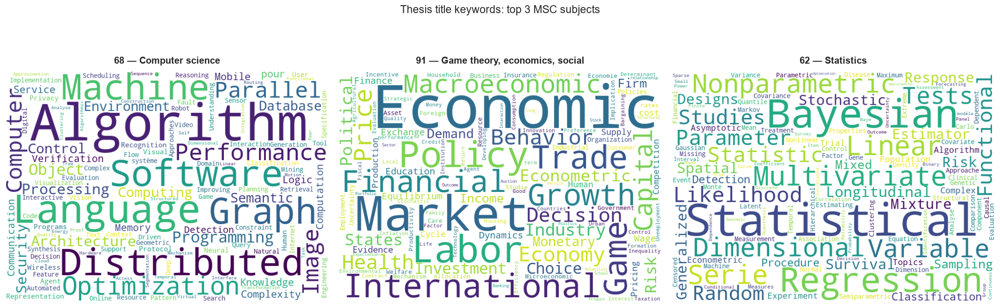

In [91]:
from wordcloud import WordCloud

custom_stopwords = {
    # generic english
    "the", "a", "an", "of", "in", "and", "for", "on", "with", "to", "by",
    "from", "at", "is", "its", "their", "some", "using", "based", "via",
    "under", "through", "non", "two", "three", "multi", "large", "high",
    "new", "real", "general", "various", "certain", "related", "over",
    "between", "within", "about", "toward", "towards", "case", "cases",
    "role", "type", "types", "effect", "effects", "impact", "aspect",
    "aspects", "topic", "essay","essays", "study", "thesis", "problem", "problems",
    # french
    "de", "la", "le", "les", "sur", "du", "des", "en", "et", "une", "un",
    "par", "au", "aux", "dans", "avec", "à",
    # german
    "und", "der", "die", "das", "ein", "eine", "über", "uber", "zur",
    "zum", "bei", "im", "zu", "mit", "von", "für", "fur", "als",
    # structural filler
    "approach", "method", "methods", "technique", "techniques",
    "contribution", "contributions", "introduction", "investigation",
    "development", "extension", "generalization", "characterization",
    "application", "applications", "theory"," theory","theorie", "theories",
}
extra_stopwords = {
    # generic academic
    "applied", "theoretical", "formal", "empirical", "optimal",
    "numerical", "computational", "probabilistic", "sequential",
    "adaptive", "oriented", "automatic", "scalable", "efficient",
    "robust", "secure", "aware", "making", "based",
    # vague nouns
    "structure", "structures", "system", "systems", "process", "processes",
    "framework", "frameworks", "design", "model", "models", "analysis",
    "information", "management", "program", "function", "functions",
    "state", "space", "level", "scale", "rate", "time", "change",
    "value", "values", "order", "point", "error", "measure",
    # cross-domain (appear in all 3, not distinctive)
    "data", "network", "networks", "dynamic", "learning",
    "modeling", "modelling", "estimation", "inference",
    "distribution", "distributions", "simulation", "prediction",
    # leftover short filler
    "united", "american", "public", "social", "corporate",
    "multiple", "testing", "test", "sample", "selection",
}

custom_stopwords = custom_stopwords | extra_stopwords
top3_codes = (
    nodes["subject_code"].dropna()
    .value_counts()
    .head(3)
    .index.tolist()
)

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

for ax, code in zip(axes, top3_codes):
    mask = nodes["subject_code"] == code
    text = " ".join(nodes.loc[mask, "thesis"].dropna().tolist())
    name = code_to_label.get(code, code)

    wc = WordCloud(
        width=700, height=500,
        background_color="white",
        colormap="viridis",
        stopwords=custom_stopwords,
        max_words=120,
        collocations=False,   # avoids repeating bigrams
        min_word_length=4,    # cuts "van", "Two", "Non" etc.
    ).generate(text)

    ax.imshow(wc, interpolation="bilinear")
    ax.axis("off")
    ax.set_title(f"{code} — {name}", fontsize=12, fontweight="bold", pad=10)

fig.suptitle("Thesis title keywords: top 3 MSC subjects", fontsize=14, y=1.01)
plt.tight_layout()
plt.savefig("thesis_wordcloud_top3.png", dpi=150, bbox_inches="tight")
plt.show()

### 9.4 Thesis Title Keywords: Top 10 MSC Subjects

Expanding the word cloud analysis to the top 10 MSC subjects confirms that
thesis title vocabulary is strongly field-specific across all ten codes, not
just the top three.

The top row covers the five largest fields. CS (68) centers on "System",
"Network", "Algorithm", and "Data". Economics (91) is anchored by "Economic",
"Market", "Labor", and "International". Statistics (62) shows "Model", "Data",
"Statistical", and "Bayesian". Numerical analysis (65) is immediately
recognizable from "Numerical", "Equation", "Finite", and "Method" — the
language of discretization and solvers. Probability theory (60) separates
cleanly with "Stochastic", "Markov", "Random", "Diffusion", and "Brownian",
terms that rarely appear in the other four panels.

The bottom row covers more specialized fields. PDE (35) is dominated by
"Equation", "Elliptic", "Nonlinear", "Boundary", "Parabolic", and "Solution"
— classical PDE vocabulary with almost no overlap with CS or economics.
Operations research (90) shows "Optimization", "Scheduling", "Programming",
"Routing", and "Integer", reflecting its algorithmic and logistics focus.
Biology and natural sciences (92) stands out with "Cell", "Protein",
"Biological", "Cancer", "Genetic", and "Population" — the most domain-specific
vocabulary in the entire grid and the clearest evidence that MSC 92 captures
math biology and bioinformatics PhDs rather than pure mathematics. Information
and communication (94) is defined by "Signal", "Channel", "Network",
"Wireless", and "Communication", reflecting coding theory and telecommunications.
Number theory (11) closes the grid with the most distinctively pure math
vocabulary: "Arithmetic", "Modular", "Diophantine", "Galois", "Automorphic",
"Conjecture", and "Form" — terms that would be nearly invisible in any of the
other nine panels.

Taken together, the ten clouds suggest that even a simple bag-of-words
representation of thesis titles carries substantial discriminative signal for
MSC classification across fields ranging from pure mathematics to applied
biology.

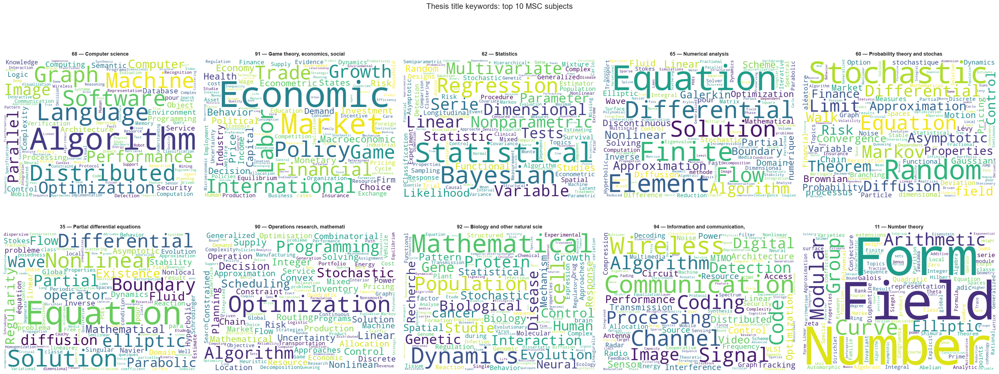

In [92]:
top10_codes = (
    nodes["subject_code"].dropna()
    .value_counts()
    .head(10)
    .index.tolist()
)

fig, axes = plt.subplots(2, 5, figsize=(30, 12))
axes = axes.flatten()

for ax, code in zip(axes, top10_codes):
    mask = nodes["subject_code"] == code
    text = " ".join(nodes.loc[mask, "thesis"].dropna().tolist())
    name = code_to_label.get(code, code)

    wc = WordCloud(
        width=700, height=500,
        background_color="white",
        colormap="viridis",
        stopwords=custom_stopwords,
        max_words=120,
        collocations=False,
        min_word_length=4,
    ).generate(text)

    ax.imshow(wc, interpolation="bilinear")
    ax.axis("off")
    ax.set_title(f"{code} — {name}", fontsize=11, fontweight="bold", pad=8)

fig.suptitle("Thesis title keywords: top 10 MSC subjects", fontsize=16, y=1.01)
plt.tight_layout()
plt.savefig("thesis_wordcloud_top10.png", dpi=150, bbox_inches="tight")
plt.show()

Usable years: 1950-2019
Subjects diagnosed: 12


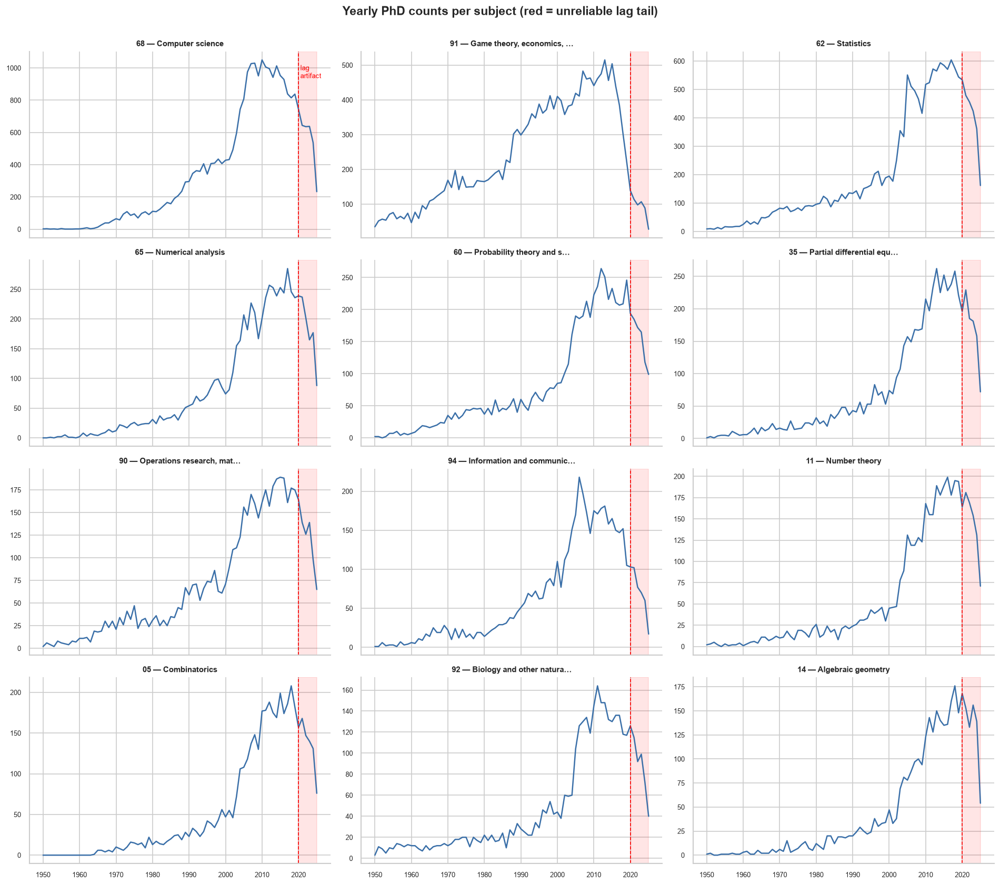

In [93]:
# %% [shared prep] -----------------------------------------------------------
# Build per-subject yearly series. Use subject_code only (manual + promoted),
# excluding prediction-only rows. Both count and share are computed.

from statsmodels.tsa.stattools import adfuller, acf, pacf

START_YEAR   = 1950   # before this, counts are too sparse to model
LAG_CUTOFF   = 2020   # counts from this year on are unreliable (data-entry lag)
TOP_N        = 12     # number of subjects to diagnose

# coded rows only, within a sane year range
coded = nodes[
    nodes["subject_code"].notna()
    & nodes["year"].notna()
    & (nodes["year"] >= START_YEAR)
    & (nodes["year"] <= 2025)
].copy()
coded["subject_code_str"] = coded["subject_code"].astype(str).str.zfill(2)
coded["year"] = coded["year"].astype(int)

code_to_name = (
    coded.groupby("subject_code_str")["subject_name"]
    .agg(lambda x: x.mode()[0])
)

def short_label(code, n=24):
    name = code_to_name.get(code, "?")
    return f"{code} — {name[:n]}{'…' if len(name) > n else ''}"

# top subjects by total coded count
top_codes = coded["subject_code_str"].value_counts().head(TOP_N).index.tolist()

# yearly count matrix: rows = year, cols = subject_code_str
years = range(START_YEAR, 2026)
counts = (
    coded[coded["subject_code_str"].isin(top_codes)]
    .groupby(["year", "subject_code_str"])
    .size()
    .unstack(fill_value=0)
    .reindex(index=years, columns=top_codes, fill_value=0)
)

# yearly share = subject count / total coded count that year (all subjects)
yearly_total = coded.groupby("year").size().reindex(years, fill_value=0)
shares = counts.div(yearly_total, axis=0).fillna(0)

# "usable" window excludes the lag tail
usable = counts.index < LAG_CUTOFF
print(f"Usable years: {START_YEAR}-{LAG_CUTOFF - 1}")
print(f"Subjects diagnosed: {len(top_codes)}")


# %% [1] per-subject series with lag cutoff marker ----------------------------
# Decides your usable training window. Everything downstream depends on it.

fig, axes = plt.subplots(4, 3, figsize=(16, 14), sharex=True)
axes = axes.flatten()

for ax, code in zip(axes, top_codes):
    ax.plot(counts.index, counts[code], color="#3a6fa8", linewidth=1.5)
    ax.axvspan(LAG_CUTOFF, 2025, color="red", alpha=0.10)
    ax.axvline(LAG_CUTOFF, color="red", linestyle="--", linewidth=1)
    ax.set_title(short_label(code), fontsize=9, fontweight="bold")
    ax.tick_params(labelsize=8)
    sns.despine(ax=ax)

axes[0].text(LAG_CUTOFF + 0.5, axes[0].get_ylim()[1] * 0.85,
             "lag\nartifact", color="red", fontsize=8)
fig.suptitle("Yearly PhD counts per subject (red = unreliable lag tail)",
             fontsize=14, fontweight="bold", y=1.00)
plt.tight_layout()
plt.savefig("diag_series.png", dpi=150, bbox_inches="tight")
plt.show()



# Rising vocabulary in thesis titles over time

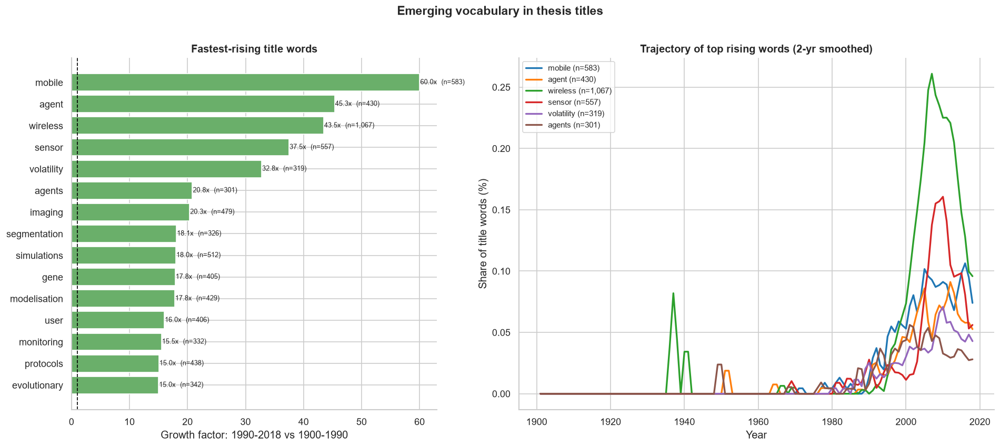

Top rising words:
        word  total   early    late   growth
      mobile    583 0.00001 0.00070 60.02003
       agent    430 0.00001 0.00051 45.34755
    wireless   1067 0.00003 0.00125 43.45667
      sensor    557 0.00002 0.00063 37.48702
  volatility    319 0.00001 0.00037 32.75948
      agents    301 0.00002 0.00036 20.81857
     imaging    479 0.00003 0.00054 20.34936
segmentation    326 0.00002 0.00038 18.07161
 simulations    512 0.00003 0.00058 17.96701
        gene    405 0.00003 0.00045 17.84510
modelisation    429 0.00003 0.00051 17.77010
        user    406 0.00003 0.00046 15.97955
  monitoring    332 0.00002 0.00038 15.49482
   protocols    438 0.00003 0.00050 15.04114
evolutionary    342 0.00003 0.00039 14.98846


In [94]:
# %% [3] Rising vocabulary in thesis titles over time ------------------------
# Idea: new terminology often appears in titles BEFORE a subject grows large.
# We measure each word's share of all title-words per year, then compare an
# early window to a late window. Words with the biggest late/early ratio are
# the "emerging" vocabulary -- candidate leading indicators.
# `n` = total times the word appears, so you can judge if a trend is solid or thin.

import re
from collections import Counter

import unicodedata


EARLY = (1900, 1990)   # baseline window
LATE  = (1990, 2018)   # recent window (stop before the post-2020 lag)
MIN_TOTAL = 300        # ignore rare words (noise)

# minimal stopwords; reuse your bigger `custom_stopwords` set if it exists
try:
    base_stop = custom_stopwords
except NameError:
    base_stop = {"the","a","an","of","in","and","for","on","with","to","by","from",
                 "study","analysis","theory","problem","problems","some","using",
                 "new","general","application","applications","approach","method",
                 "methods","model","models","system","systems","based"}

extra_filler = {"novel", "online", "approach", "framework", "toward", "towards",
                "investigation", "study", "studies", "essay", "essays","improving"}
extra_filler |= {"para", "understanding", "physical", "driven", "limits",
                 "structured", "general", "properties", "results"}
STOP = base_stop | extra_filler
tdf = nodes.dropna(subset=["thesis", "year"]).copy()
tdf["year"] = tdf["year"].astype(int)
tdf = tdf[(tdf["year"] >= EARLY[0]) & (tdf["year"] <= LATE[1])]

token_re = re.compile(r"[a-z]{4,}")  # alphabetic, length >= 4


def strip_accents(s):
    return "".join(c for c in unicodedata.normalize("NFD", s)
                   if unicodedata.category(c) != "Mn")

def tokens(title):
    title = strip_accents(title.lower())
    return [w for w in token_re.findall(title) if w not in STOP]

# count word occurrences per year and total words per year
year_word = {}      # year -> Counter of words
year_total = {}     # year -> total word count
for year, title in zip(tdf["year"], tdf["thesis"]):
    toks = tokens(title)
    year_word.setdefault(year, Counter()).update(toks)
    year_total[year] = year_total.get(year, 0) + len(toks)

# overall frequency to filter rare words
overall = Counter()
for c in year_word.values():
    overall.update(c)
common_words = {w for w, n in overall.items() if n >= MIN_TOTAL}

def window_share(word, lo, hi):
    """Average yearly share of a word across [lo, hi]."""
    shares = []
    for y in range(lo, hi + 1):
        tot = year_total.get(y, 0)
        if tot > 0:
            shares.append(year_word.get(y, Counter()).get(word, 0) / tot)
    return np.mean(shares) if shares else 0.0

rows = []
for w in common_words:
    e = window_share(w, *EARLY)
    l = window_share(w, *LATE)
    if e > 0:
        rows.append({"word": w, "early": e, "late": l, "growth": l / e,
                     "total": overall[w]})        # raw count of the word
vocab = pd.DataFrame(rows)

rising  = vocab[vocab["early"] >= 1e-5].nlargest(15, "growth")
falling = vocab[vocab["late"]  >= 1e-5].nsmallest(15, "growth")

# --- plot: rising/falling bars + trajectories of top rising words -----------
fig, axes = plt.subplots(1, 2, figsize=(16, 7), gridspec_kw={"width_ratios": [1, 1.3]})

# left: growth factor bars (annotation now shows count too)
order = rising.sort_values("growth")
axes[0].barh(order["word"], order["growth"], color="#6aaf6a", edgecolor="white")
axes[0].axvline(1, color="black", linestyle="--", linewidth=1)
for i, (_, r) in enumerate(order.iterrows()):
    axes[0].text(r["growth"] + 0.1, i,
                 f"{r['growth']:.1f}x  (n={int(r['total']):,})",   # ratio + count
                 va="center", fontsize=8)
axes[0].set_xlabel(f"Growth factor: {LATE[0]}-{LATE[1]} vs {EARLY[0]}-{EARLY[1]}")
axes[0].set_title("Fastest-rising title words", fontsize=12, fontweight="bold")
sns.despine(ax=axes[0])

# right: yearly trajectory of the top 6 rising words (count shown in legend)
years = list(range(EARLY[0], LATE[1] + 1))
palette = sns.color_palette("tab10", 6)
for color, (_, r) in zip(palette, rising.nlargest(6, "growth").iterrows()):
    word = r["word"]
    traj = [year_word.get(y, Counter()).get(word, 0) / max(year_total.get(y, 1), 1)
            for y in years]
    traj = pd.Series(traj, index=years).rolling(2, center=True).mean()
    axes[1].plot(years, traj * 100, label=f"{word} (n={int(r['total']):,})",
                 linewidth=2, color=color)
axes[1].set_xlabel("Year")
axes[1].set_ylabel("Share of title words (%)")
axes[1].set_title("Trajectory of top rising words (2-yr smoothed)",
                  fontsize=12, fontweight="bold")
axes[1].legend(fontsize=9)
sns.despine(ax=axes[1])

fig.suptitle("Emerging vocabulary in thesis titles", fontsize=14, fontweight="bold", y=1.01)
plt.tight_layout()
plt.savefig("rising_vocabulary.png", dpi=150, bbox_inches="tight")
plt.show()

print("Top rising words:")
print(rising[["word", "total", "early", "late", "growth"]].round(5).to_string(index=False))

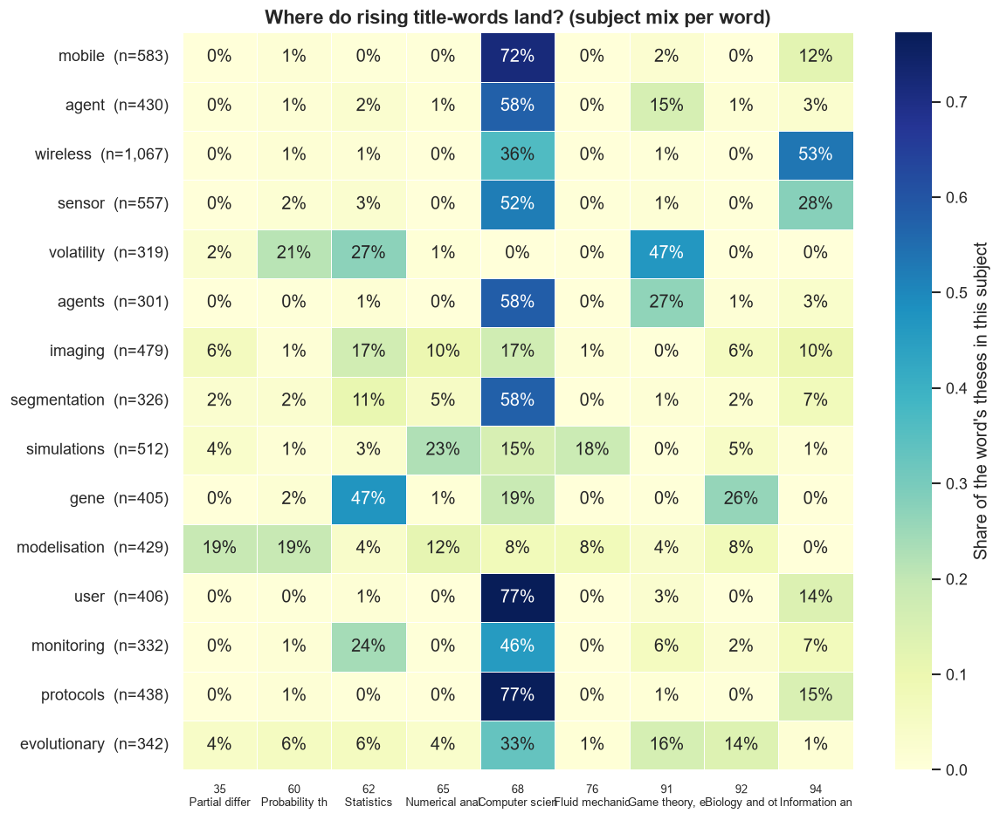

        word  total  n_theses                   top_subject  top_share
        user    406       277         68 — Computer science      0.773
   protocols    438       270         68 — Computer science      0.767
      mobile    583       422         68 — Computer science      0.718
      agents    301       207         68 — Computer science      0.580
       agent    430       330         68 — Computer science      0.576
segmentation    326       205         68 — Computer science      0.576
    wireless   1067       835 94 — Information and communic      0.532
      sensor    557       422         68 — Computer science      0.521
        gene    405       290               62 — Statistics      0.472
  volatility    319       245 91 — Game theory, economics,       0.465
  monitoring    332       212         68 — Computer science      0.458
evolutionary    342       226         68 — Computer science      0.332
 simulations    512       314       65 — Numerical analysis      0.226
modeli

In [95]:
# %% Link rising words to subjects (needs `rising`, `LATE` from prev cell) ----
# For each rising word, which subjects do its theses belong to? If a word
# concentrates in one subject, it is a candidate leading indicator for it.
# Two counts are shown:
#   total      = times the word appears overall (from `rising`, judges reliability)
#   n_theses   = coded theses in the recent window that contain it (heatmap base)

rising_words = rising["word"].tolist()
word_total = dict(zip(rising["word"], rising["total"]))   # overall count per word

# coded theses in the recent window only
late_df = nodes.dropna(subset=["thesis", "subject_code", "year"]).copy()
late_df["year"] = late_df["year"].astype(int)
late_df = late_df[(late_df["year"] >= LATE[0]) & (late_df["year"] <= LATE[1])]
late_df["code"] = late_df["subject_code"].astype(int).astype(str).str.zfill(2)
late_df["thesis_lc"] = late_df["thesis"].str.lower()

code_to_name = (
    nodes.dropna(subset=["subject_code", "subject_name"])
    .assign(code=lambda d: d["subject_code"].astype(int).astype(str).str.zfill(2))
    .groupby("code")["subject_name"].agg(lambda x: x.mode()[0])
)

# for each word, subject distribution of theses containing it
word_subj = {}      # word -> Series(code -> share)
summary_rows = []
for w in rising_words:
    mask = late_df["thesis_lc"].str.contains(rf"\b{re.escape(w)}\b", regex=True)
    sub = late_df.loc[mask, "code"]
    if len(sub) == 0:
        continue
    dist = sub.value_counts(normalize=True)
    word_subj[w] = dist
    top_code = dist.index[0]
    summary_rows.append({
        "word": w,
        "total": int(word_total.get(w, 0)),       # overall occurrence count
        "n_theses": int(mask.sum()),              # coded theses in recent window
        "top_subject": f"{top_code} — {code_to_name.get(top_code, '?')[:24]}",
        "top_share": dist.iloc[0],
    })

summary = pd.DataFrame(summary_rows)

# subjects to show as heatmap columns: union of each word's top-2 subjects
top_codes = sorted({c for d in word_subj.values() for c in d.index[:2]})

mat = pd.DataFrame(
    {w: word_subj[w].reindex(top_codes).fillna(0) for w in word_subj},
).T  # rows = words, cols = subject codes
mat.columns = [f"{c}\n{code_to_name.get(c, '?')[:14]}" for c in top_codes]

# add the count to each row label so it shows on the heatmap y-axis
mat.index = [f"{w}  (n={int(word_total.get(w, 0)):,})" for w in mat.index]

# --- plot -------------------------------------------------------------------
fig, ax = plt.subplots(figsize=(max(10, len(top_codes) * 0.9), 8))
sns.heatmap(
    mat, annot=True, fmt=".0%", cmap="YlGnBu",
    cbar_kws={"label": "Share of the word's theses in this subject"},
    linewidths=0.5, ax=ax,
)
ax.set_title("Where do rising title-words land? (subject mix per word)",
             fontsize=13, fontweight="bold")
ax.set_xlabel("")
ax.set_ylabel("")
plt.xticks(rotation=0, fontsize=8)
plt.yticks(rotation=0)
plt.tight_layout()
plt.savefig("words_to_subjects.png", dpi=150, bbox_inches="tight")
plt.show()

print(summary.sort_values("top_share", ascending=False).round(3).to_string(index=False))

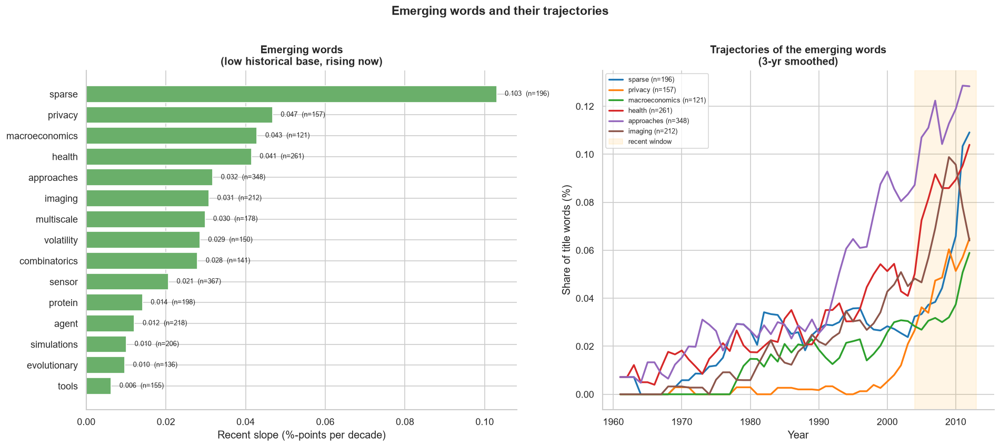

Emerging words (small before, rising now):
          word  total  recent_n  hist_share  recent_slope
        sparse    518       196     0.00019       0.10299
       privacy    312       157     0.00002       0.04675
macroeconomics    310       121     0.00011       0.04288
        health    623       261     0.00024       0.04146
    approaches    840       348     0.00034       0.03175
       imaging    479       212     0.00016       0.03081
    multiscale    325       178     0.00004       0.02981
    volatility    319       150     0.00010       0.02853
 combinatorics    350       141     0.00014       0.02794
        sensor    557       367     0.00008       0.02063
       protein    397       198     0.00020       0.01412
         agent    430       218     0.00012       0.01210
   simulations    512       206     0.00022       0.01007
  evolutionary    342       136     0.00015       0.00968
         tools    383       155     0.00015       0.00626


In [96]:
# %% True emergence: low historical base + rising now (needs cell 3 objects) --
# A word counts as emerging only if it was SMALL historically AND is rising now.
# Counts (n) are shown so you can tell solid trends from thin ones.

TREND_START = 1960
TREND_END   = 2013     # try 2013 to cut more of the lag tail (see right panel)
RECENT      = 10
MIN_RECENT_N = 50         # require enough recent occurrences to trust the slope
HIST_END    = TREND_END - RECENT   # history = TREND_START .. HIST_END

all_years    = list(range(TREND_START, TREND_END + 1))
hist_years   = list(range(TREND_START, HIST_END + 1))
recent_years = list(range(TREND_END - RECENT + 1, TREND_END + 1))

def share_at(word, years):
    return np.array([
        year_word.get(y, Counter()).get(word, 0) / year_total[y]
        for y in years if year_total.get(y, 0) > 0
    ])

def slope_pd(word, years):
    ys = share_at(word, years)
    if len(ys) < 5:
        return np.nan
    return np.polyfit(range(len(ys)), ys, 1)[0] * 10 * 100  # %-pts per decade

def count_in(word, years):
    return sum(year_word.get(y, Counter()).get(word, 0) for y in years)

rows = []
for w in common_words:
    rows.append({
        "word":         w,
        "hist_share":   share_at(w, hist_years).mean(),   # historical level
        "recent_slope": slope_pd(w, recent_years),        # rising now?
        "recent_n":     count_in(w, recent_years),        # recent volume
        "total":        overall[w],                       # overall volume
    })
em = pd.DataFrame(rows).dropna()

# emerging = small historically, enough recent data, rising fast
em["hist_share"] = em["word"].apply(lambda w: share_at(w, hist_years).mean())
em["recent_share"] = em["word"].apply(lambda w: share_at(w, recent_years).mean())
em["jump"] = em["recent_share"] / (em["hist_share"] + 1e-9)   # how many x it grew

emerging = (
    em[(em["recent_n"] >= MIN_RECENT_N) &
       (em["recent_slope"] > 0) &
       (em["jump"] >= 3)]               # recent share at least 3x its history
    .nlargest(15, "recent_slope")
)

# ── plot: emerging words + the year_total lag diagnostic ────────────────────
fig, axes = plt.subplots(1, 2, figsize=(16, 7), gridspec_kw={"width_ratios": [1.1, 1]})

# left: genuinely emerging words, labelled with recent count
d = emerging.sort_values("recent_slope")
axes[0].barh(d["word"], d["recent_slope"], color="#6aaf6a", edgecolor="white")
for i, (_, r) in enumerate(d.iterrows()):
    axes[0].text(r["recent_slope"] + d["recent_slope"].max() * 0.02, i,
                 f"{r['recent_slope']:.3f}  (n={int(r['recent_n']):,})",
                 va="center", fontsize=8)
axes[0].set_xlabel("Recent slope (%-points per decade)")
axes[0].set_title("Emerging words\n(low historical base, rising now)",
                  fontsize=12, fontweight="bold")
sns.despine(ax=axes[0])

# right: trajectories of the emerging words from the left panel
plot_years = list(range(TREND_START, TREND_END + 1))
palette = sns.color_palette("tab10", len(emerging))

# show the top 6 by slope so the plot stays readable
for color, (_, r) in zip(palette, emerging.nlargest(6, "recent_slope").iterrows()):
    word = r["word"]
    traj = [year_word.get(y, Counter()).get(word, 0) / max(year_total.get(y, 1), 1)
            for y in plot_years]
    traj = pd.Series(traj, index=plot_years).rolling(3, center=True).mean() * 100
    axes[1].plot(plot_years, traj, color=color, linewidth=2,
                 label=f"{word} (n={int(r['recent_n']):,})")

axes[1].axvspan(HIST_END + 1, TREND_END, color="orange", alpha=0.10,
                label="recent window")
axes[1].set_xlabel("Year")
axes[1].set_ylabel("Share of title words (%)")
axes[1].set_title("Trajectories of the emerging words\n(3-yr smoothed)",
                  fontsize=12, fontweight="bold")
axes[1].legend(fontsize=8)
sns.despine(ax=axes[1])

fig.suptitle("Emerging words and their trajectories", fontsize=14, fontweight="bold", y=1.01)
plt.tight_layout()
plt.savefig("true_emergence.png", dpi=150, bbox_inches="tight")
plt.show()

print("Emerging words (small before, rising now):")
print(emerging[["word", "total", "recent_n", "hist_share", "recent_slope"]]
      .round(5).to_string(index=False))

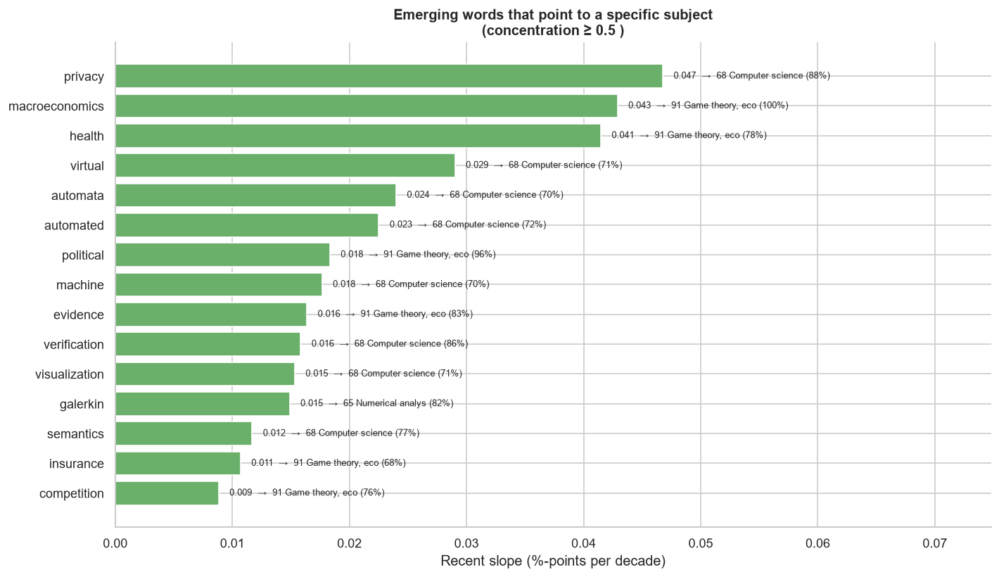

Emerging + subject-concentrated words:
          word  recent_n  recent_slope  herf         top_subject  top_share
       privacy       157         0.047 0.783 68 Computer science      0.883
macroeconomics       121         0.043 0.991 91 Game theory, eco      0.995
        health       261         0.041 0.627 91 Game theory, eco      0.784
       virtual       120         0.029 0.512 68 Computer science      0.711
      automata       105         0.024 0.504 68 Computer science      0.702
     automated       150         0.023 0.533 68 Computer science      0.723
     political       148         0.018 0.916 91 Game theory, eco      0.957
       machine       206         0.018 0.505 68 Computer science      0.701
      evidence       125         0.016 0.697 91 Game theory, eco      0.832
  verification       238         0.016 0.747 68 Computer science      0.862
 visualization       126         0.015 0.509 68 Computer science      0.705
      galerkin       119         0.015 0.672 65 N

In [97]:
# %% Emergence filtered by subject concentration (needs cell 3 objects) -------
# Structural fix: instead of blocklisting generic words by hand, drop any word
# that scatters across many subjects. A real topic word concentrates in one;
# a generic word ("approaches", "practical") spreads everywhere. The filter is
# self-maintaining -- no stopword upkeep needed.

TREND_START = 1960
TREND_END   = 2013        # cut the lag tail (volume falls after ~2013)
RECENT      = 10
MIN_RECENT_N = 50         # need enough recent data to trust the slope
CONCENTRATION_MIN = 0.5  # Herfindahl floor; raise to be stricter
HIST_END    = TREND_END - RECENT

hist_years   = list(range(TREND_START, HIST_END + 1))
recent_years = list(range(TREND_END - RECENT + 1, TREND_END + 1))

def share_at(word, years):
    return np.array([
        year_word.get(y, Counter()).get(word, 0) / year_total[y]
        for y in years if year_total.get(y, 0) > 0
    ])

def slope_pd(word, years):
    ys = share_at(word, years)
    return np.polyfit(range(len(ys)), ys, 1)[0] * 10 * 100 if len(ys) >= 5 else np.nan

def count_in(word, years):
    return sum(year_word.get(y, Counter()).get(word, 0) for y in years)

# --- subject distribution per word (recent, coded theses) -------------------
coded = nodes.dropna(subset=["thesis", "subject_code", "year"]).copy()
coded["year"] = coded["year"].astype(int)
coded = coded[(coded["year"] >= TREND_START) & (coded["year"] <= TREND_END)]
coded["code"] = coded["subject_code"].astype(int).astype(str).str.zfill(2)
coded["thesis_lc"] = coded["thesis"].str.lower()

code_to_name = (
    nodes.dropna(subset=["subject_code", "subject_name"])
    .assign(code=lambda d: d["subject_code"].astype(int).astype(str).str.zfill(2))
    .groupby("code")["subject_name"].agg(lambda x: x.mode()[0])
)

def subject_profile(word):
    """Return (herfindahl, top_code, top_share) for a word's coded theses."""
    mask = coded["thesis_lc"].str.contains(rf"\b{re.escape(word)}\b", regex=True)
    sub = coded.loc[mask, "code"]
    if len(sub) < 20:                 # too few coded theses to judge
        return np.nan, None, np.nan
    dist = sub.value_counts(normalize=True)
    herf = (dist ** 2).sum()          # 1 = single subject, ~0 = scattered
    return herf, dist.index[0], dist.iloc[0]

# --- build candidate table --------------------------------------------------
rows = []
for w in common_words:
    hist = share_at(w, hist_years).mean()
    rows.append({
        "word": w,
        "hist_share": hist,
        "recent_slope": slope_pd(w, recent_years),
        "recent_n": count_in(w, recent_years),
        "total": overall[w],
    })
em = pd.DataFrame(rows).dropna()

# first pass: small history + enough recent data + rising
base_cutoff = em["hist_share"].median()
cand = em[(em["hist_share"] <= base_cutoff) &
          (em["recent_n"] >= MIN_RECENT_N) &
          (em["recent_slope"] > 0)].copy()

# second pass: keep only words that concentrate in a subject
prof = cand["word"].apply(subject_profile)
cand[["herf", "top_code", "top_share"]] = pd.DataFrame(prof.tolist(), index=cand.index)
cand = cand.dropna(subset=["herf"])
cand["top_subject"] = cand["top_code"].map(lambda c: f"{c} {code_to_name.get(c,'?')[:16]}")

emerging = (
    cand[cand["herf"] >= CONCENTRATION_MIN]
    .nlargest(15, "recent_slope")
)

# --- plot -------------------------------------------------------------------
fig, ax = plt.subplots(figsize=(12, 7))
d = emerging.sort_values("recent_slope")
bars = ax.barh(d["word"], d["recent_slope"], color="#6aaf6a", edgecolor="white")
for i, (_, r) in enumerate(d.iterrows()):
    ax.text(r["recent_slope"] + d["recent_slope"].max() * 0.02, i,
            f"{r['recent_slope']:.3f}  →  {r['top_subject']} ({r['top_share']:.0%})",
            va="center", fontsize=8)
ax.set_xlabel("Recent slope (%-points per decade)")
ax.set_title("Emerging words that point to a specific subject\n"
             f"(concentration ≥ {CONCENTRATION_MIN} )",
             fontsize=12, fontweight="bold")
ax.set_xlim(0, d["recent_slope"].max() * 1.6)
sns.despine(ax=ax)
plt.tight_layout()
plt.savefig("emergence_concentrated.png", dpi=150, bbox_inches="tight")
plt.show()

print("Emerging + subject-concentrated words:")
print(emerging[["word", "recent_n", "recent_slope", "herf", "top_subject", "top_share"]]
      .round(3).to_string(index=False))

# Subject inheritance and leaving through the advisor-student genealogy

Edges with both subjects known: 154,365
Subject inheritance rate:       68.7%
Random-chance baseline:         7.2%
Lift over chance:               9.6x


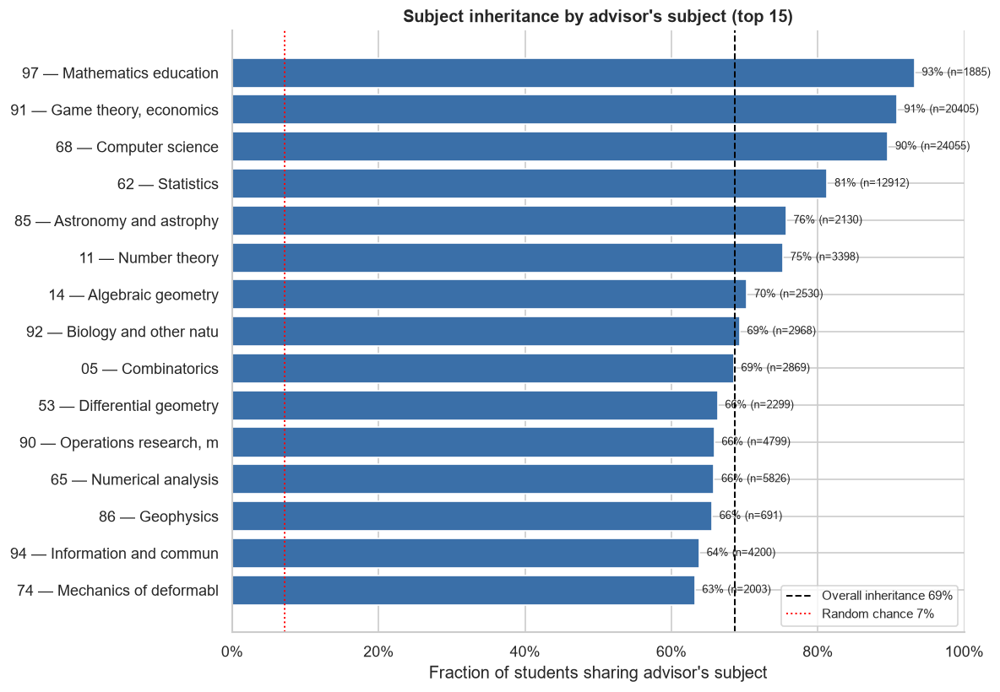

In [98]:

# Idea: if students tend to share their advisor's subject, subject propagates
# through the tree -- a structural predictor no time-series model would capture.

# map person id -> subject code (coded rows only)
subj = (
    nodes.dropna(subset=["subject_code"])
    .assign(code=lambda d: d["subject_code"].astype(int).astype(str).str.zfill(2))
    .set_index("id")["code"]
    .to_dict()
)

# collect edges where BOTH advisor and student have a known subject
adv_codes, stu_codes = [], []
for advisor_id, students in zip(nodes["id"], nodes["students"]):
    a = subj.get(advisor_id)
    if a is None:
        continue
    for student_id in students:
        s = subj.get(student_id)
        if s is not None:
            adv_codes.append(a)
            stu_codes.append(s)

edges = pd.DataFrame({"advisor": adv_codes, "student": stu_codes})
edges["match"] = edges["advisor"] == edges["student"]

overall_rate = edges["match"].mean()

# random-chance baseline: probability two random coded people share a subject
p = pd.Series(stu_codes).value_counts(normalize=True)
chance = (p ** 2).sum()

print(f"Edges with both subjects known: {len(edges):,}")
print(f"Subject inheritance rate:       {overall_rate:.1%}")
print(f"Random-chance baseline:         {chance:.1%}")
print(f"Lift over chance:               {overall_rate / chance:.1f}x")

# per-subject inheritance rate (advisor's subject -> fraction of matching students)
code_to_name = (
    nodes.dropna(subset=["subject_code", "subject_name"])
    .assign(code=lambda d: d["subject_code"].astype(int).astype(str).str.zfill(2))
    .groupby("code")["subject_name"].agg(lambda x: x.mode()[0])
)

per_subj = (
    edges.groupby("advisor")
    .agg(n=("match", "count"), rate=("match", "mean"))
    .query("n >= 50")                      # enough students to be meaningful
    .sort_values("rate", ascending=False)
    .head(15)
)
per_subj["label"] = [
    f"{c} — {code_to_name.get(c, '?')[:22]}" for c in per_subj.index
]

fig, ax = plt.subplots(figsize=(10, 7))
order = per_subj.sort_values("rate")
bars = ax.barh(order["label"], order["rate"], color="#3a6fa8", edgecolor="white")
ax.axvline(overall_rate, color="black", linestyle="--", linewidth=1.2,
           label=f"Overall inheritance {overall_rate:.0%}")
ax.axvline(chance, color="red", linestyle=":", linewidth=1.2,
           label=f"Random chance {chance:.0%}")
for i, (_, r) in enumerate(order.iterrows()):
    ax.text(r["rate"] + 0.01, i, f"{r['rate']:.0%} (n={int(r['n'])})",
            va="center", fontsize=8)
ax.set_xlabel("Fraction of students sharing advisor's subject")
ax.set_title("Subject inheritance by advisor's subject (top 15)",
             fontsize=12, fontweight="bold")
ax.xaxis.set_major_formatter(mticker.PercentFormatter(xmax=1))
ax.set_xlim(0, 1)
ax.legend(fontsize=9)
sns.despine(ax=ax)
plt.tight_layout()
plt.savefig("subject_inheritance.png", dpi=150, bbox_inches="tight")
plt.show()

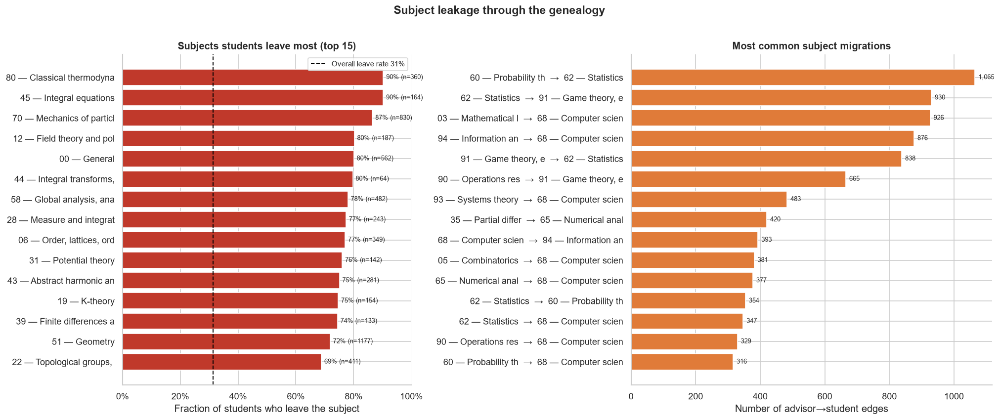

Highest leave-rate subjects:
                    label    n  leave_rate
80 — Classical thermodyna  360       0.903
  45 — Integral equations  164       0.902
70 — Mechanics of particl  830       0.865
12 — Field theory and pol  187       0.802
             00 — General  562       0.801
44 — Integral transforms,   64       0.797
58 — Global analysis, ana  482       0.780
28 — Measure and integrat  243       0.774
06 — Order, lattices, ord  349       0.771
    31 — Potential theory  142       0.761
43 — Abstract harmonic an  281       0.751
            19 — K-theory  154       0.747
39 — Finite differences a  133       0.744
            51 — Geometry 1177       0.719
22 — Topological groups,   411       0.689

Top migration flows:
advisor student  count
     60      62   1065
     62      91    930
     03      68    926
     94      68    876
     91      62    838
     90      91    665
     93      68    483
     35      65    420
     68      94    393
     05      68    381
     65 

In [99]:
# %% Which subjects do students LEAVE? (needs `edges` + `code_to_name` from prev cell)
# leave rate = 1 - inheritance rate. High leave rate = students rarely stay in
# the advisor's subject. We also trace WHERE the leavers go.

def lbl(code, n=20):
    return f"{code} — {code_to_name.get(code, '?')[:n]}"

# --- 1. leave rate per advisor subject --------------------------------------
leave = (
    edges.groupby("advisor")
    .agg(n=("match", "count"), stay=("match", "mean"))
    .assign(leave_rate=lambda d: 1 - d["stay"])
    .query("n >= 50")                       # enough students to be meaningful
    .sort_values("leave_rate", ascending=False)
    .head(15)
)
leave["label"] = [lbl(c) for c in leave.index]

overall_leave = 1 - edges["match"].mean()

# --- 2. top migration flows (source subject -> different destination) --------
leavers = edges[~edges["match"]]
flows = (
    leavers.groupby(["advisor", "student"])
    .size()
    .reset_index(name="count")
    .sort_values("count", ascending=False)
    .head(15)
)
flows["label"] = [f"{lbl(a, 14)}  →  {lbl(s, 14)}"
                  for a, s in zip(flows["advisor"], flows["student"])]

# --- plot -------------------------------------------------------------------
fig, axes = plt.subplots(1, 2, figsize=(17, 7),
                         gridspec_kw={"width_ratios": [1, 1.25]})

# left: highest leave-rate subjects
order = leave.sort_values("leave_rate")
axes[0].barh(order["label"], order["leave_rate"], color="#c0392b", edgecolor="white")
axes[0].axvline(overall_leave, color="black", linestyle="--", linewidth=1.2,
                label=f"Overall leave rate {overall_leave:.0%}")
for i, (_, r) in enumerate(order.iterrows()):
    axes[0].text(r["leave_rate"] + 0.01, i, f"{r['leave_rate']:.0%} (n={int(r['n'])})",
                 va="center", fontsize=8)
axes[0].set_xlabel("Fraction of students who leave the subject")
axes[0].set_title("Subjects students leave most (top 15)", fontsize=12, fontweight="bold")
axes[0].xaxis.set_major_formatter(mticker.PercentFormatter(xmax=1))
axes[0].set_xlim(0, 1)
axes[0].legend(fontsize=9)
sns.despine(ax=axes[0])

# right: most common migration flows
order_f = flows.sort_values("count")
axes[1].barh(order_f["label"], order_f["count"], color="#e07b39", edgecolor="white")
for i, v in enumerate(order_f["count"]):
    axes[1].text(v + order_f["count"].max() * 0.01, i, f"{v:,}", va="center", fontsize=8)
axes[1].set_xlabel("Number of advisor→student edges")
axes[1].set_title("Most common subject migrations", fontsize=12, fontweight="bold")
sns.despine(ax=axes[1])

fig.suptitle("Subject leakage through the genealogy", fontsize=14, fontweight="bold", y=1.01)
plt.tight_layout()
plt.savefig("subject_leakage.png", dpi=150, bbox_inches="tight")
plt.show()

print("Highest leave-rate subjects:")
print(leave[["label", "n", "leave_rate"]].round(3).to_string(index=False))
print("\nTop migration flows:")
print(flows[["advisor", "student", "count"]].to_string(index=False))

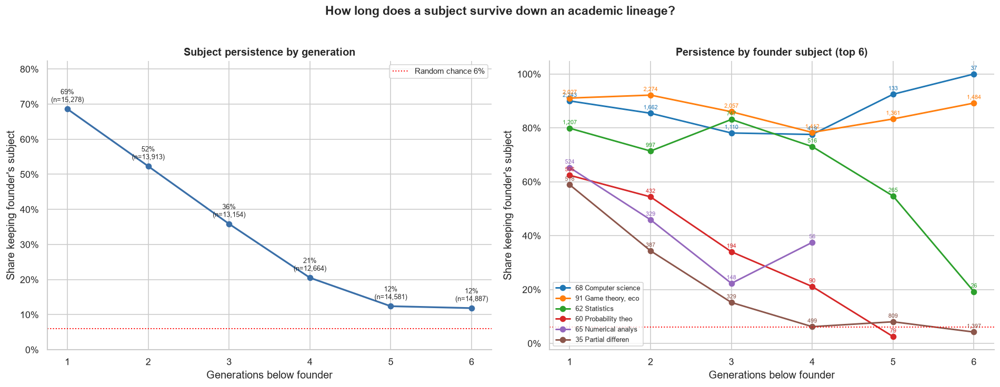

Overall persistence by generation:
  gen 1: 68.6%  (n=15,278)
  gen 2: 52.3%  (n=13,913)
  gen 3: 35.9%  (n=13,154)
  gen 4: 20.5%  (n=12,664)
  gen 5: 12.4%  (n=14,581)
  gen 6: 11.9%  (n=14,887)
Random-chance baseline: 6.0%


In [100]:
# %% Subject persistence by generation (decay down a lineage) ----------------
# Start from "founders" (people with a known subject), walk their descendants
# generation by generation, and measure what fraction still share the founder's
# subject at each depth. Slow decay = subject is sticky down the lineage.
#
# Founders are sampled (tracing all is too costly) and traversal is cycle-safe.
from collections import deque, defaultdict

MAX_GEN     = 6        # how many generations deep to walk
SAMPLE_N    = 4000     # founders to sample (None = all; slower)
PER_FOUNDER_CAP = 4000 # safety cap on descendants visited per founder
SEED        = 0

rng = np.random.default_rng(SEED)

# children map: parent id -> list of child ids (a row's students are its children)
children = {pid: studs for pid, studs in zip(nodes["id"], nodes["students"]) if studs}

# id -> subject code (coded rows only)
subj = (
    nodes.dropna(subset=["subject_code"])
    .assign(code=lambda d: d["subject_code"].astype(int).astype(str).str.zfill(2))
    .set_index("id")["code"].to_dict()
)
code_to_name = (
    nodes.dropna(subset=["subject_code", "subject_name"])
    .assign(code=lambda d: d["subject_code"].astype(int).astype(str).str.zfill(2))
    .groupby("code")["subject_name"].agg(lambda x: x.mode()[0])
)

# founders: have a subject AND at least one student
founders = [pid for pid in children if pid in subj]
if SAMPLE_N and len(founders) > SAMPLE_N:
    founders = list(rng.choice(founders, SAMPLE_N, replace=False))

# accumulators: counts[gen] = [match, total];  per_subj[code][gen] = [match, total]
counts   = defaultdict(lambda: [0, 0])
per_subj = defaultdict(lambda: defaultdict(lambda: [0, 0]))

for f in founders:
    f_code = subj[f]
    visited = {f}
    queue = deque([(f, 0)])
    seen = 0
    while queue:
        node, gen = queue.popleft()
        if gen >= MAX_GEN or seen > PER_FOUNDER_CAP:
            continue
        for child in children.get(node, []):
            if child in visited:
                continue
            visited.add(child)
            seen += 1
            g = gen + 1
            c_code = subj.get(child)
            if c_code is not None:                    # only score coded descendants
                match = int(c_code == f_code)
                counts[g][0] += match
                counts[g][1] += 1
                per_subj[f_code][g][0] += match
                per_subj[f_code][g][1] += 1
            queue.append((child, g))

# overall decay curve
gens = list(range(1, MAX_GEN + 1))
persist = [counts[g][0] / counts[g][1] if counts[g][1] else np.nan for g in gens]
ns      = [counts[g][1] for g in gens]

# random-chance baseline: prob two coded people share a subject
p = pd.Series(list(subj.values())).value_counts(normalize=True)
chance = (p ** 2).sum()

# --- plot -------------------------------------------------------------------
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# left: overall decay
axes[0].plot(gens, persist, marker="o", color="#3a6fa8", linewidth=2)
axes[0].axhline(chance, color="red", linestyle=":", linewidth=1.2,
                label=f"Random chance {chance:.0%}")
for g, v, n in zip(gens, persist, ns):
    if not np.isnan(v):
        axes[0].text(g, v + 0.02, f"{v:.0%}\n(n={n:,})", ha="center", fontsize=8)
axes[0].set_xlabel("Generations below founder")
axes[0].set_ylabel("Share keeping founder's subject")
axes[0].set_title("Subject persistence by generation", fontsize=12, fontweight="bold")
axes[0].set_ylim(0, max(persist) * 1.2)
axes[0].set_xticks(gens)
axes[0].yaxis.set_major_formatter(mticker.PercentFormatter(xmax=1))
axes[0].legend(fontsize=9)
sns.despine(ax=axes[0])

# right: per-subject decay for the top founder subjects (by gen-1 sample size)
top_codes = sorted(per_subj, key=lambda c: per_subj[c][1][1], reverse=True)[:6]
palette = sns.color_palette("tab10", len(top_codes))
MIN_N = 20   # below this, the point is too noisy to plot

for color, code in zip(palette, top_codes):
    ys, valid_gens, nlist = [], [], []
    for g in gens:
        match, tot = per_subj[code][g]
        if tot >= MIN_N:
            ys.append(match / tot)
            valid_gens.append(g)
            nlist.append(tot)
    axes[1].plot(valid_gens, ys, marker="o", color=color, linewidth=1.8,
                 label=f"{code} {code_to_name.get(code,'?')[:16]}")
    # annotate each point with its sample size
    for g, v, n in zip(valid_gens, ys, nlist):
        axes[1].text(g, v + 0.015, f"{n:,}", ha="center", fontsize=6.5,
                     color=color)
axes[1].axhline(chance, color="red", linestyle=":", linewidth=1.2)
axes[1].set_xlabel("Generations below founder")
axes[1].set_ylabel("Share keeping founder's subject")
axes[1].set_title("Persistence by founder subject (top 6)", fontsize=12, fontweight="bold")
axes[1].set_xticks(gens)
axes[1].yaxis.set_major_formatter(mticker.PercentFormatter(xmax=1))
axes[1].legend(fontsize=8)
sns.despine(ax=axes[1])

fig.suptitle("How long does a subject survive down an academic lineage?",
             fontsize=14, fontweight="bold", y=1.02)
plt.tight_layout()
plt.savefig("subject_persistence.png", dpi=150, bbox_inches="tight")
plt.show()

print("Overall persistence by generation:")
for g, v, n in zip(gens, persist, ns):
    print(f"  gen {g}: {v:.1%}  (n={n:,})" if not np.isnan(v) else f"  gen {g}: --")
print(f"Random-chance baseline: {chance:.1%}")